In [2]:
# # %tensorflow_version only exists in Colab.
%tensorflow_version 2.x

TensorFlow 2.x selected.


# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![GAN examples](https://doc-0k-08-docs.googleusercontent.com/docs/securesc/e9a9l2i13n2i71hah3gkbkb2o7u28not/pv90gp6gl8bblidjfkju9if3alhkb8ct/1574467200000/04925025873724478501/00642677519571603546/1UP1VpQ8w-VjT9mckx_aRXMvZrQoy6zpN?authuser=0&nonce=im3us5dn9h3p4&user=00642677519571603546&hash=tn15o7bra6r16h6errhdl54mhinsgnu5)


## Setup

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

DRIVE_DIR = '/content/drive/My Drive/uu_deep_learning_data/gan'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load(os.path.join(DRIVE_DIR, 'gan-checks-tf.npz'))

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [0]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 0s 0us/step


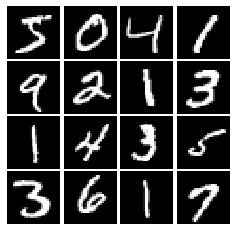

In [6]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [0]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return tf.maximum(x, 0) + alpha * tf.minimum(x, 0)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [8]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [0]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform((batch_size, dim), minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [10]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [0]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape=(784, ), activation=leaky_relu),
        tf.keras.layers.Dense(256, activation=leaky_relu),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [12]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with input size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [0]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim, ), activation='relu'),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.Dense(784, activation=tf.keras.activations.tanh)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [14]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [0]:
bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = bce(tf.zeros_like(logits_fake), logits_fake)
    loss +=  bce(tf.ones_like(logits_real), logits_real)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing the (scalar) loss for the generator.
    """
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = bce(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [16]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [17]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [0]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [0]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.124, G:0.6988
Instructions for updating:
Use tf.identity instead.


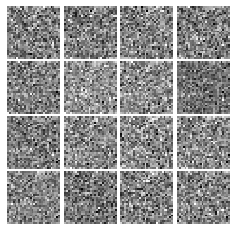

Epoch: 0, Iter: 20, D: 0.5701, G:0.9786


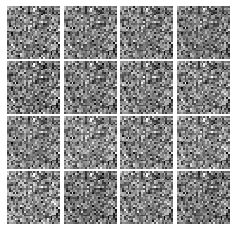

Epoch: 0, Iter: 40, D: 0.4184, G:1.22


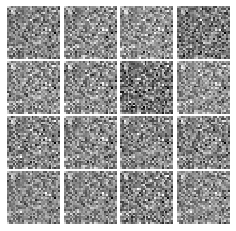

Epoch: 0, Iter: 60, D: 0.1569, G:3.306


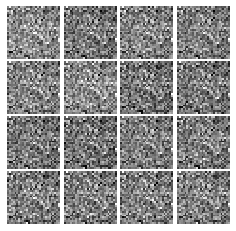

Epoch: 0, Iter: 80, D: 0.6916, G:2.474


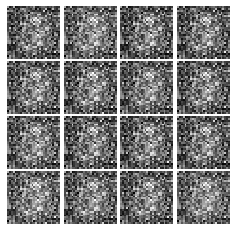

Epoch: 0, Iter: 100, D: 1.841, G:0.8461


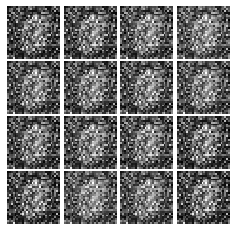

Epoch: 0, Iter: 120, D: 1.391, G:1.142


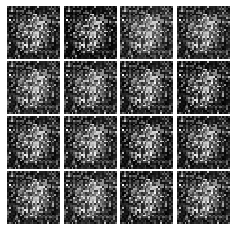

Epoch: 0, Iter: 140, D: 1.368, G:1.072


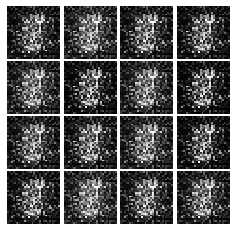

Epoch: 0, Iter: 160, D: 1.197, G:1.282


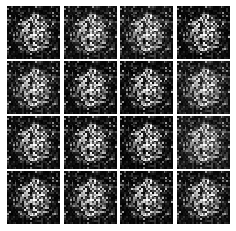

Epoch: 0, Iter: 180, D: 1.902, G:1.681


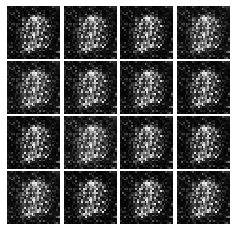

Epoch: 0, Iter: 200, D: 1.55, G:1.329


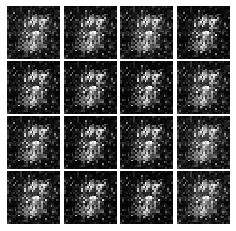

Epoch: 0, Iter: 220, D: 0.9108, G:1.574


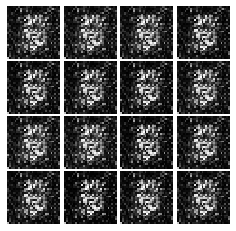

Epoch: 0, Iter: 240, D: 0.6976, G:1.674


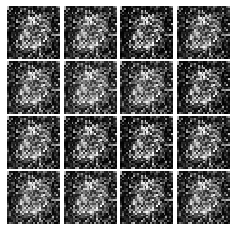

Epoch: 0, Iter: 260, D: 1.545, G:0.6915


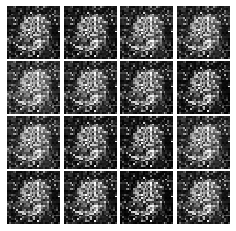

Epoch: 0, Iter: 280, D: 0.9504, G:1.939


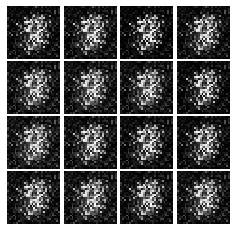

Epoch: 0, Iter: 300, D: 0.9468, G:1.667


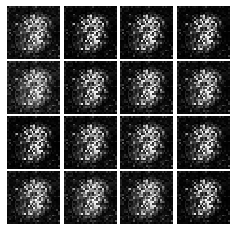

Epoch: 0, Iter: 320, D: 0.7907, G:1.334


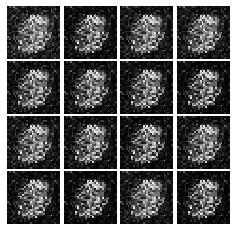

Epoch: 0, Iter: 340, D: 0.7743, G:1.499


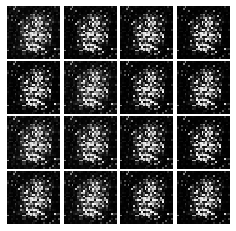

Epoch: 0, Iter: 360, D: 0.9574, G:1.966


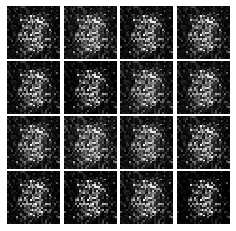

Epoch: 0, Iter: 380, D: 1.48, G:1.329


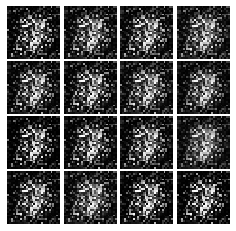

Epoch: 0, Iter: 400, D: 1.513, G:1.163


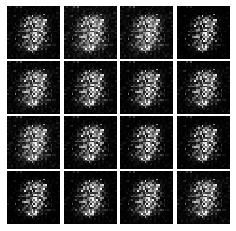

Epoch: 0, Iter: 420, D: 1.459, G:0.86


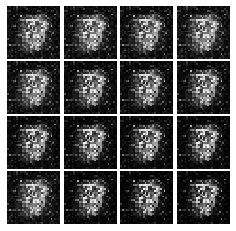

Epoch: 0, Iter: 440, D: 1.608, G:0.9612


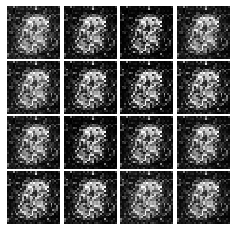

Epoch: 0, Iter: 460, D: 0.9114, G:2.938


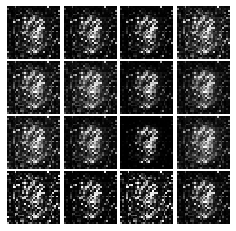

Epoch: 1, Iter: 480, D: 1.313, G:0.7871


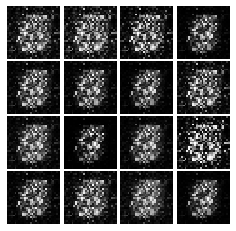

Epoch: 1, Iter: 500, D: 1.401, G:1.224


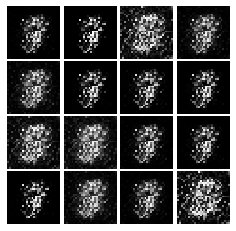

Epoch: 1, Iter: 520, D: 1.403, G:1.094


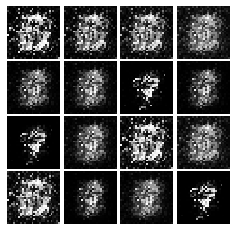

Epoch: 1, Iter: 540, D: 1.814, G:1.033


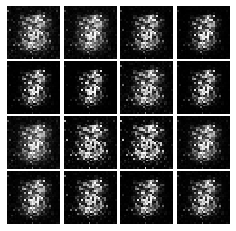

Epoch: 1, Iter: 560, D: 1.154, G:1.821


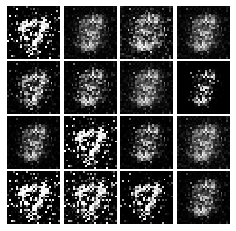

Epoch: 1, Iter: 580, D: 1.5, G:1.31


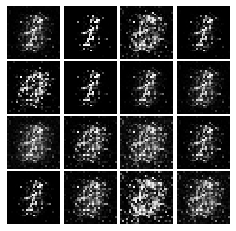

Epoch: 1, Iter: 600, D: 1.396, G:1.503


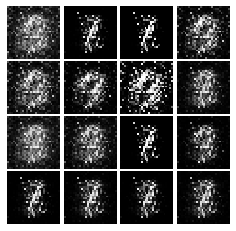

Epoch: 1, Iter: 620, D: 1.299, G:0.999


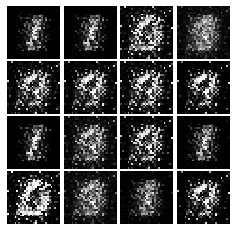

Epoch: 1, Iter: 640, D: 0.8988, G:1.625


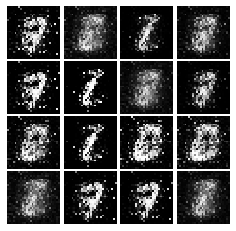

Epoch: 1, Iter: 660, D: 0.9818, G:1.844


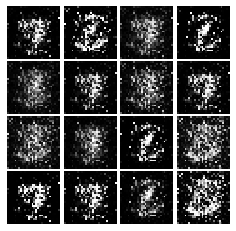

Epoch: 1, Iter: 680, D: 1.185, G:1.785


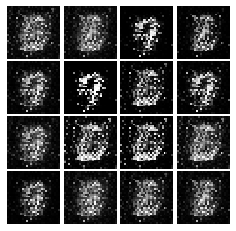

Epoch: 1, Iter: 700, D: 1.327, G:0.8388


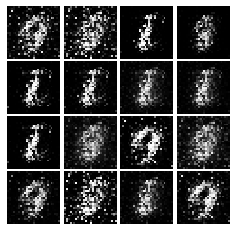

Epoch: 1, Iter: 720, D: 1.389, G:2.017


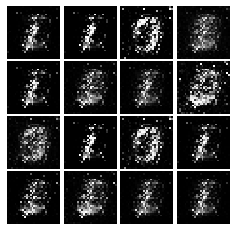

Epoch: 1, Iter: 740, D: 1.507, G:0.6797


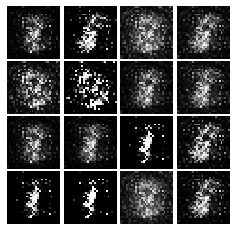

Epoch: 1, Iter: 760, D: 1.418, G:2.057


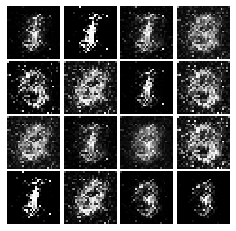

Epoch: 1, Iter: 780, D: 1.244, G:1.895


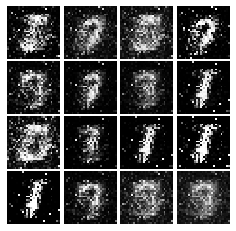

Epoch: 1, Iter: 800, D: 1.395, G:1.09


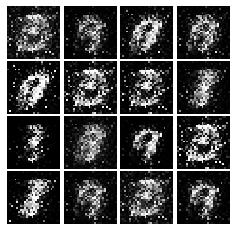

Epoch: 1, Iter: 820, D: 1.545, G:1.032


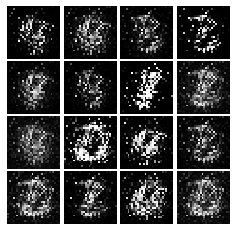

Epoch: 1, Iter: 840, D: 1.28, G:1.32


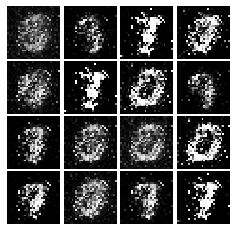

Epoch: 1, Iter: 860, D: 1.063, G:1.637


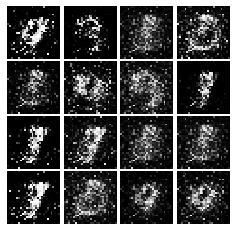

Epoch: 1, Iter: 880, D: 1.14, G:0.8799


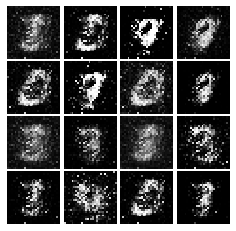

Epoch: 1, Iter: 900, D: 1.31, G:1.41


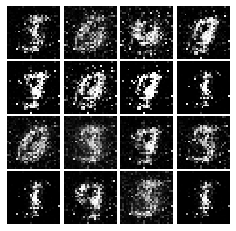

Epoch: 1, Iter: 920, D: 2.253, G:0.149


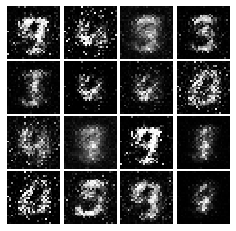

Epoch: 2, Iter: 940, D: 1.312, G:1.109


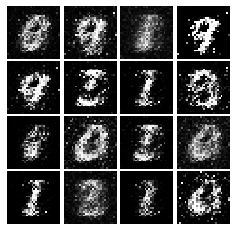

Epoch: 2, Iter: 960, D: 1.229, G:1.082


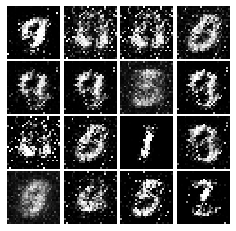

Epoch: 2, Iter: 980, D: 1.175, G:1.013


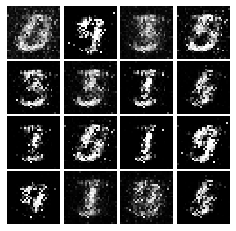

Epoch: 2, Iter: 1000, D: 1.202, G:1.444


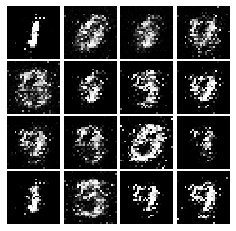

Epoch: 2, Iter: 1020, D: 1.247, G:1.819


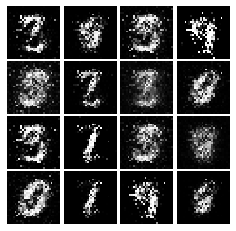

Epoch: 2, Iter: 1040, D: 1.352, G:0.9712


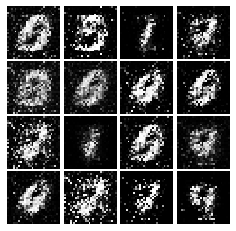

Epoch: 2, Iter: 1060, D: 1.304, G:0.9449


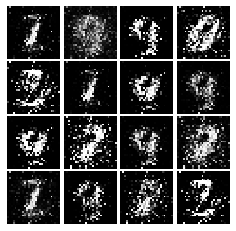

Epoch: 2, Iter: 1080, D: 1.141, G:1.025


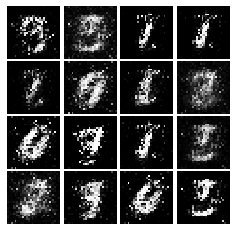

Epoch: 2, Iter: 1100, D: 1.302, G:1.143


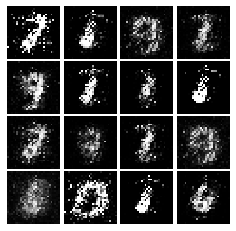

Epoch: 2, Iter: 1120, D: 1.373, G:1.178


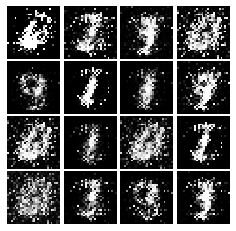

Epoch: 2, Iter: 1140, D: 1.226, G:0.9287


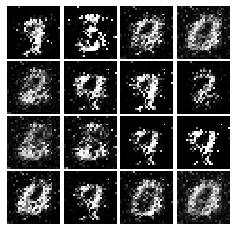

Epoch: 2, Iter: 1160, D: 1.172, G:1.049


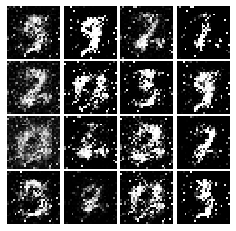

Epoch: 2, Iter: 1180, D: 1.118, G:0.7261


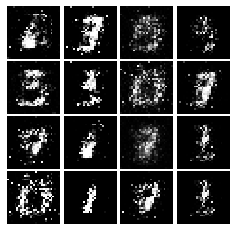

Epoch: 2, Iter: 1200, D: 1.033, G:1.333


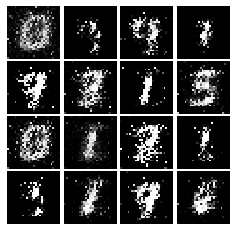

Epoch: 2, Iter: 1220, D: 1.159, G:0.9393


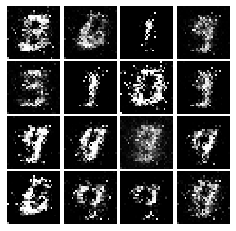

Epoch: 2, Iter: 1240, D: 1.061, G:1.021


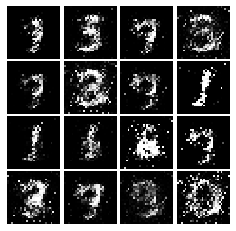

Epoch: 2, Iter: 1260, D: 1.185, G:1.081


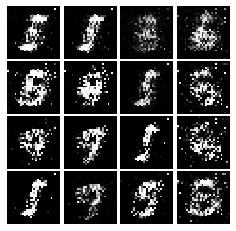

Epoch: 2, Iter: 1280, D: 0.9948, G:0.8503


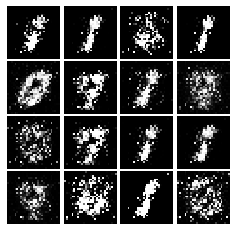

Epoch: 2, Iter: 1300, D: 1.221, G:1.092


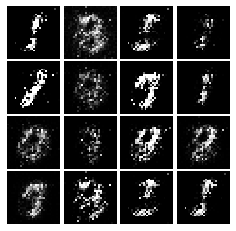

Epoch: 2, Iter: 1320, D: 1.016, G:1.432


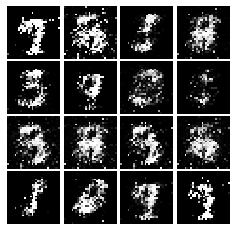

Epoch: 2, Iter: 1340, D: 1.239, G:1.236


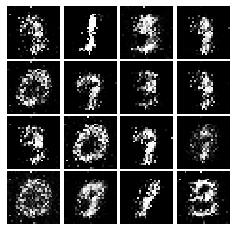

Epoch: 2, Iter: 1360, D: 1.27, G:1.122


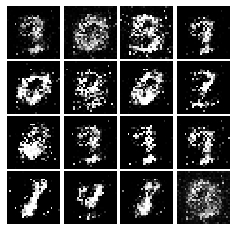

Epoch: 2, Iter: 1380, D: 1.093, G:1.333


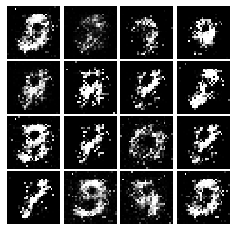

Epoch: 2, Iter: 1400, D: 1.168, G:0.8317


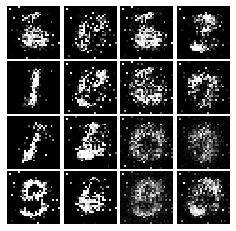

Epoch: 3, Iter: 1420, D: 1.108, G:1.075


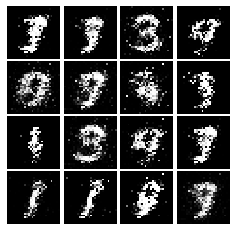

Epoch: 3, Iter: 1440, D: 1.043, G:1.844


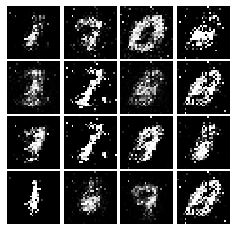

Epoch: 3, Iter: 1460, D: 1.442, G:1.219


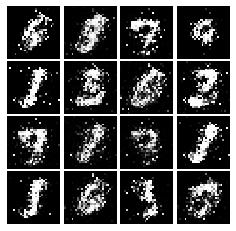

Epoch: 3, Iter: 1480, D: 1.202, G:0.8994


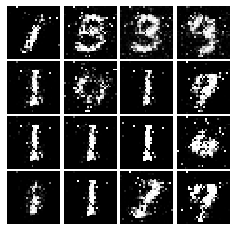

Epoch: 3, Iter: 1500, D: 1.317, G:0.8897


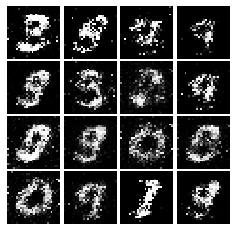

Epoch: 3, Iter: 1520, D: 1.302, G:0.9128


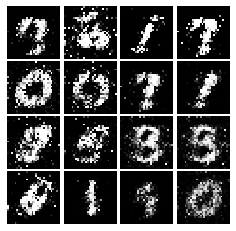

Epoch: 3, Iter: 1540, D: 1.193, G:0.9524


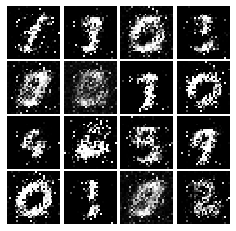

Epoch: 3, Iter: 1560, D: 1.296, G:1.151


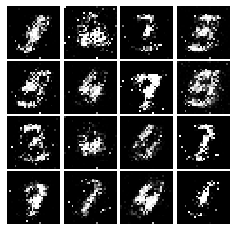

Epoch: 3, Iter: 1580, D: 1.165, G:1.428


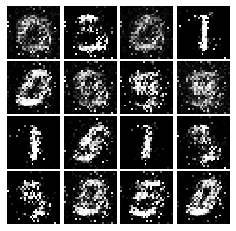

Epoch: 3, Iter: 1600, D: 1.312, G:1.114


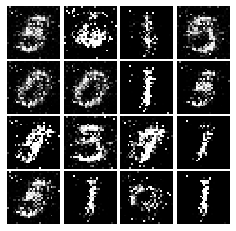

Epoch: 3, Iter: 1620, D: 1.221, G:1.05


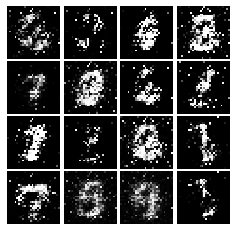

Epoch: 3, Iter: 1640, D: 1.224, G:1.021


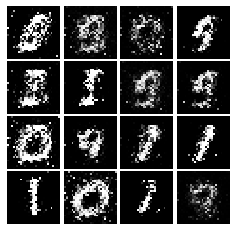

Epoch: 3, Iter: 1660, D: 1.121, G:0.9829


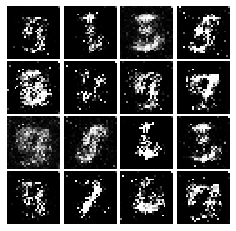

Epoch: 3, Iter: 1680, D: 1.235, G:1.046


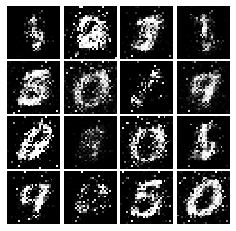

Epoch: 3, Iter: 1700, D: 1.311, G:1.039


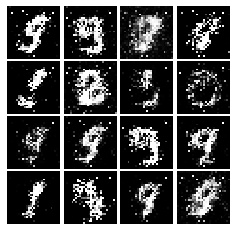

Epoch: 3, Iter: 1720, D: 1.294, G:0.9413


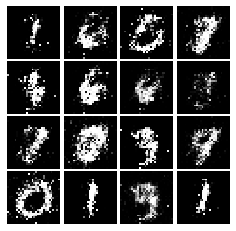

Epoch: 3, Iter: 1740, D: 1.295, G:1.021


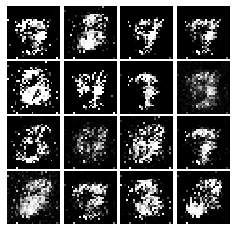

Epoch: 3, Iter: 1760, D: 1.482, G:0.8337


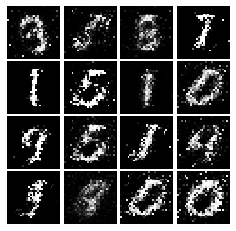

Epoch: 3, Iter: 1780, D: 1.19, G:1.108


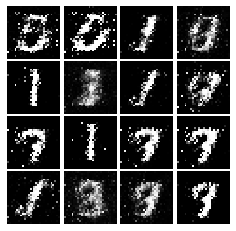

Epoch: 3, Iter: 1800, D: 1.346, G:0.8208


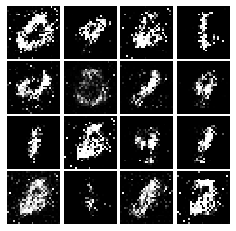

Epoch: 3, Iter: 1820, D: 1.239, G:0.9913


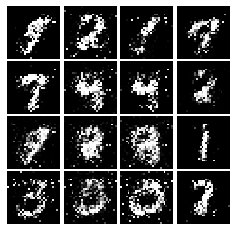

Epoch: 3, Iter: 1840, D: 1.282, G:0.835


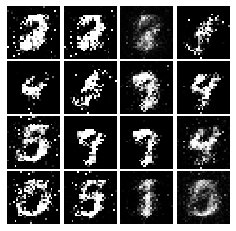

Epoch: 3, Iter: 1860, D: 1.176, G:1.033


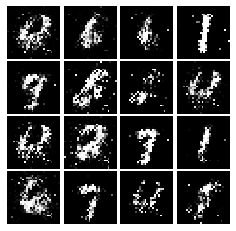

Epoch: 4, Iter: 1880, D: 1.259, G:0.9376


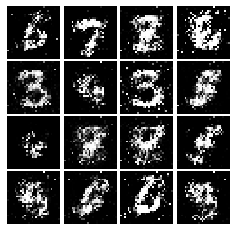

Epoch: 4, Iter: 1900, D: 1.368, G:1.004


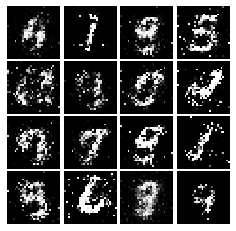

Epoch: 4, Iter: 1920, D: 1.269, G:1.078


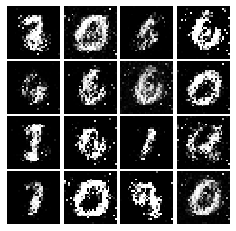

Epoch: 4, Iter: 1940, D: 1.361, G:0.9935


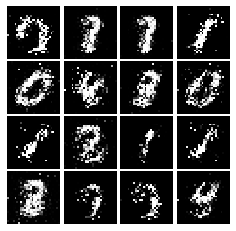

Epoch: 4, Iter: 1960, D: 1.342, G:0.9324


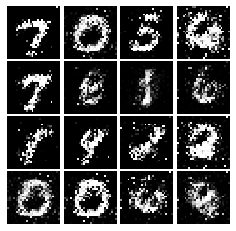

Epoch: 4, Iter: 1980, D: 1.197, G:0.9687


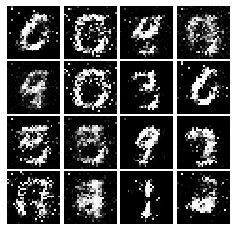

Epoch: 4, Iter: 2000, D: 1.461, G:2.575


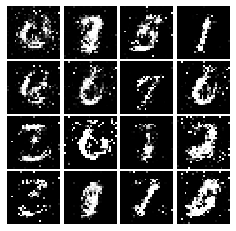

Epoch: 4, Iter: 2020, D: 1.236, G:0.904


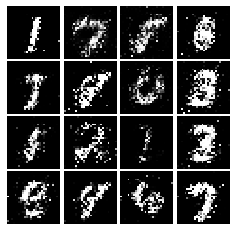

Epoch: 4, Iter: 2040, D: 1.369, G:1.17


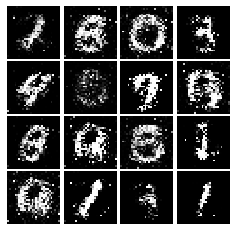

Epoch: 4, Iter: 2060, D: 1.277, G:0.92


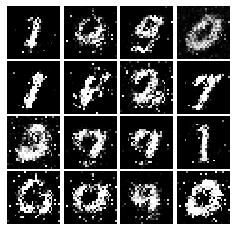

Epoch: 4, Iter: 2080, D: 1.282, G:0.8189


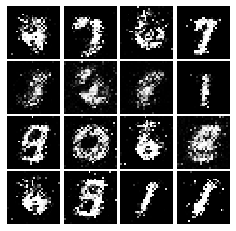

Epoch: 4, Iter: 2100, D: 1.363, G:1.041


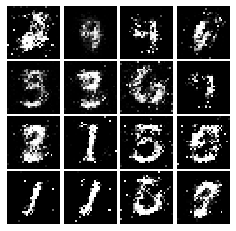

Epoch: 4, Iter: 2120, D: 1.385, G:0.8326


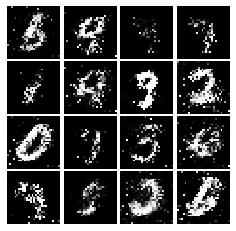

Epoch: 4, Iter: 2140, D: 1.409, G:0.8262


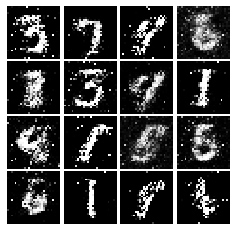

Epoch: 4, Iter: 2160, D: 1.368, G:0.7939


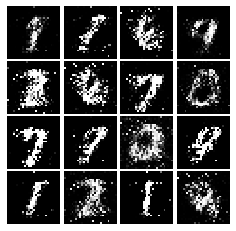

Epoch: 4, Iter: 2180, D: 1.168, G:1.027


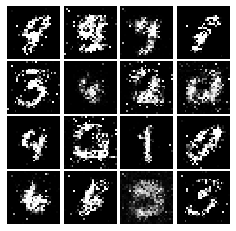

Epoch: 4, Iter: 2200, D: 1.167, G:0.9314


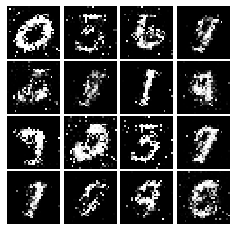

Epoch: 4, Iter: 2220, D: 1.204, G:0.8827


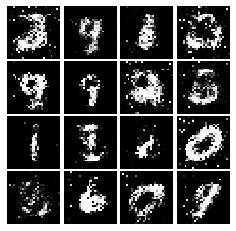

Epoch: 4, Iter: 2240, D: 1.262, G:0.8332


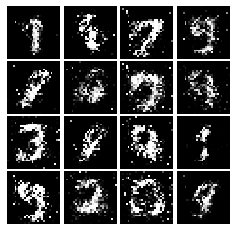

Epoch: 4, Iter: 2260, D: 1.392, G:0.8032


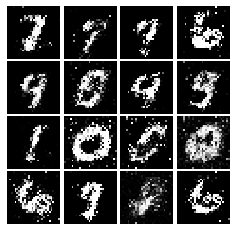

Epoch: 4, Iter: 2280, D: 1.282, G:0.919


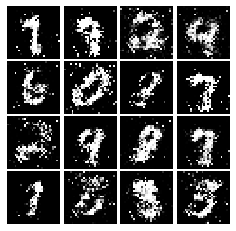

Epoch: 4, Iter: 2300, D: 1.17, G:1.155


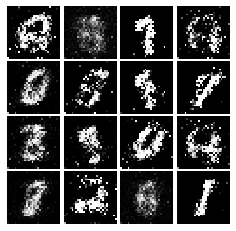

Epoch: 4, Iter: 2320, D: 1.163, G:1.106


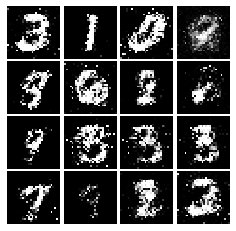

Epoch: 4, Iter: 2340, D: 1.227, G:0.8644


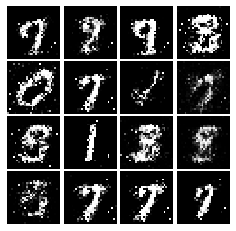

Epoch: 5, Iter: 2360, D: 1.192, G:0.9422


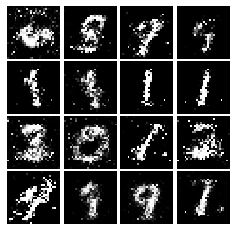

Epoch: 5, Iter: 2380, D: 1.331, G:0.9331


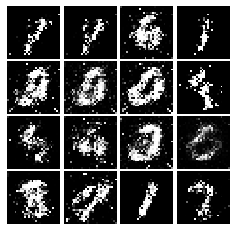

Epoch: 5, Iter: 2400, D: 1.262, G:0.9909


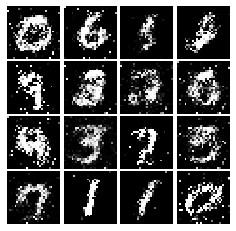

Epoch: 5, Iter: 2420, D: 1.089, G:0.9894


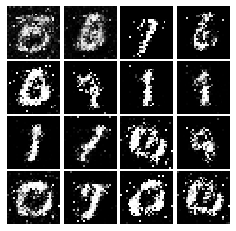

Epoch: 5, Iter: 2440, D: 1.291, G:1.071


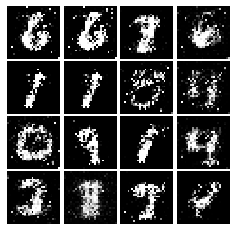

Epoch: 5, Iter: 2460, D: 1.324, G:1.016


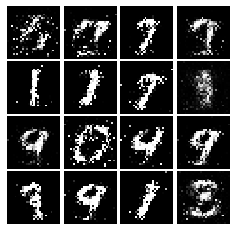

Epoch: 5, Iter: 2480, D: 1.272, G:0.9592


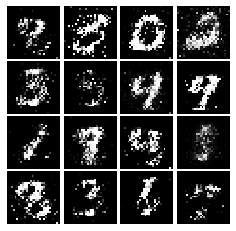

Epoch: 5, Iter: 2500, D: 1.14, G:1.533


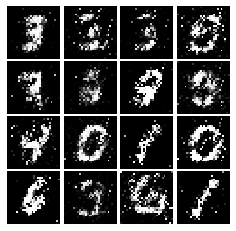

Epoch: 5, Iter: 2520, D: 1.371, G:0.9327


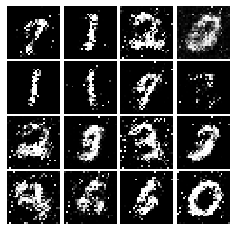

Epoch: 5, Iter: 2540, D: 1.23, G:0.9509


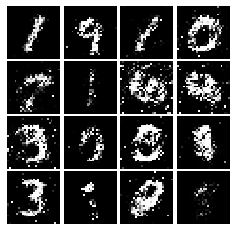

Epoch: 5, Iter: 2560, D: 1.322, G:0.8918


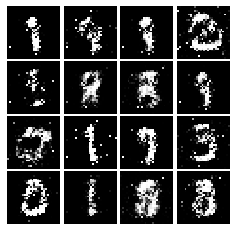

Epoch: 5, Iter: 2580, D: 1.407, G:0.7976


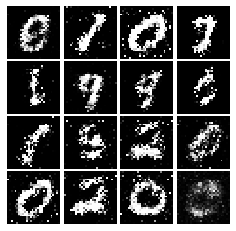

Epoch: 5, Iter: 2600, D: 1.425, G:0.7863


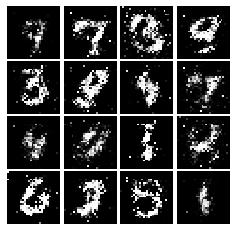

Epoch: 5, Iter: 2620, D: 1.278, G:0.9264


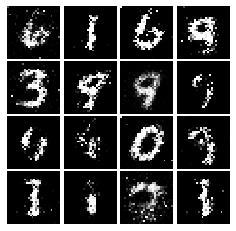

Epoch: 5, Iter: 2640, D: 1.378, G:0.879


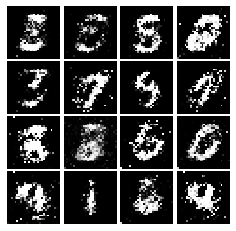

Epoch: 5, Iter: 2660, D: 1.265, G:0.867


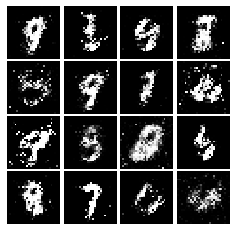

Epoch: 5, Iter: 2680, D: 1.399, G:0.9665


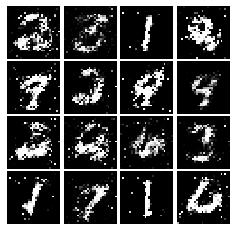

Epoch: 5, Iter: 2700, D: 1.385, G:1.793


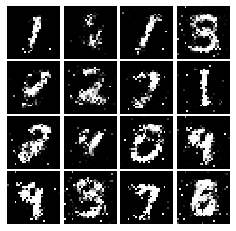

Epoch: 5, Iter: 2720, D: 1.196, G:0.983


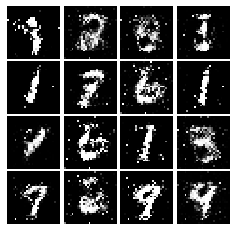

Epoch: 5, Iter: 2740, D: 1.288, G:0.9735


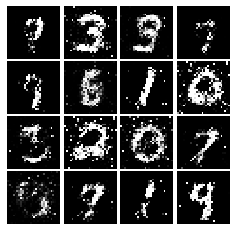

Epoch: 5, Iter: 2760, D: 1.35, G:0.9074


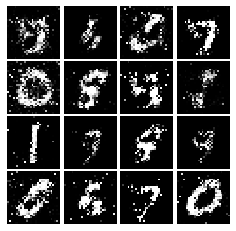

Epoch: 5, Iter: 2780, D: 1.184, G:0.892


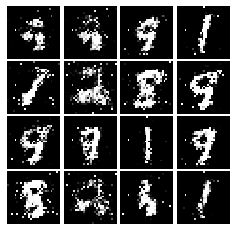

Epoch: 5, Iter: 2800, D: 1.183, G:0.8885


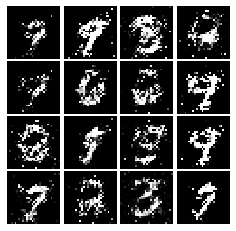

Epoch: 6, Iter: 2820, D: 1.36, G:0.9169


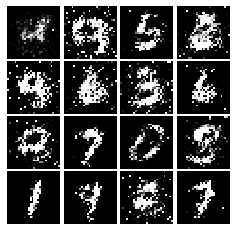

Epoch: 6, Iter: 2840, D: 1.31, G:0.9215


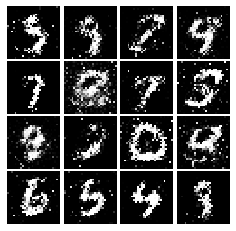

Epoch: 6, Iter: 2860, D: 1.298, G:0.8536


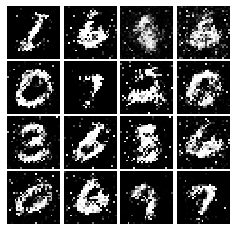

Epoch: 6, Iter: 2880, D: 1.183, G:1.033


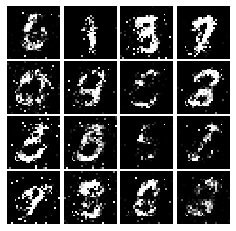

Epoch: 6, Iter: 2900, D: 1.278, G:0.7894


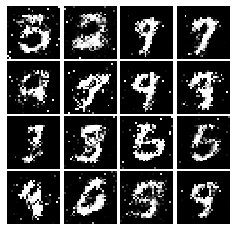

Epoch: 6, Iter: 2920, D: 1.331, G:0.9064


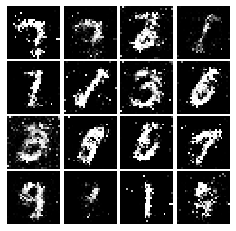

Epoch: 6, Iter: 2940, D: 1.332, G:0.9681


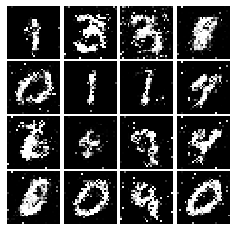

Epoch: 6, Iter: 2960, D: 1.293, G:0.8442


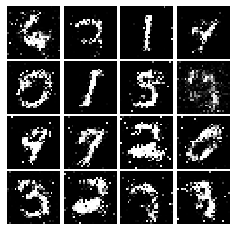

Epoch: 6, Iter: 2980, D: 1.378, G:0.8266


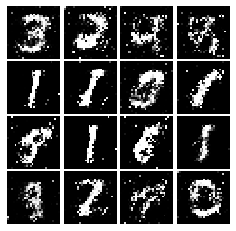

Epoch: 6, Iter: 3000, D: 1.317, G:1.023


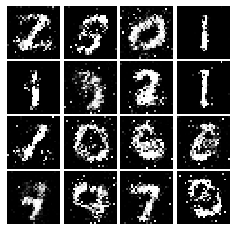

Epoch: 6, Iter: 3020, D: 1.272, G:1.004


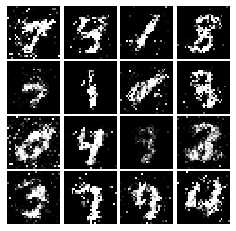

Epoch: 6, Iter: 3040, D: 1.262, G:1.07


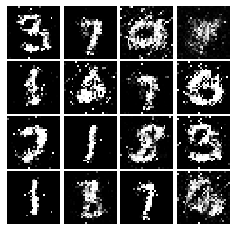

Epoch: 6, Iter: 3060, D: 1.387, G:0.8249


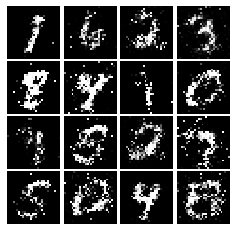

Epoch: 6, Iter: 3080, D: 1.34, G:0.8902


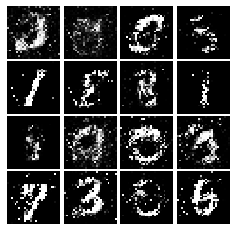

Epoch: 6, Iter: 3100, D: 1.326, G:0.8883


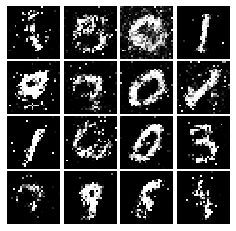

Epoch: 6, Iter: 3120, D: 1.237, G:0.8388


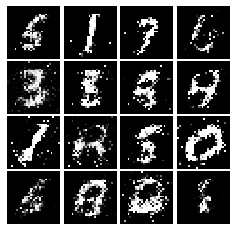

Epoch: 6, Iter: 3140, D: 1.345, G:0.8126


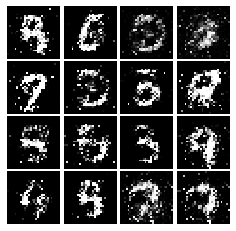

Epoch: 6, Iter: 3160, D: 1.316, G:0.9847


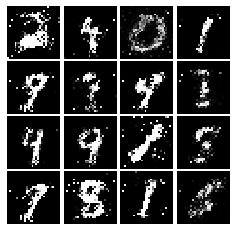

Epoch: 6, Iter: 3180, D: 1.277, G:0.9037


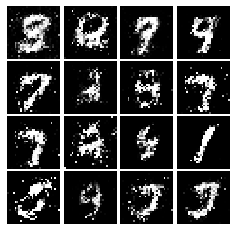

Epoch: 6, Iter: 3200, D: 1.299, G:0.7925


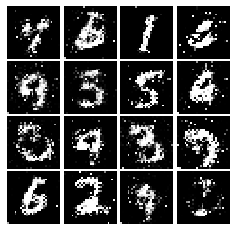

Epoch: 6, Iter: 3220, D: 1.354, G:0.8817


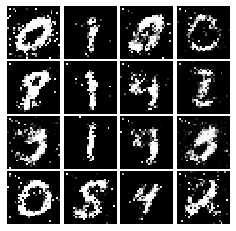

Epoch: 6, Iter: 3240, D: 1.268, G:0.7706


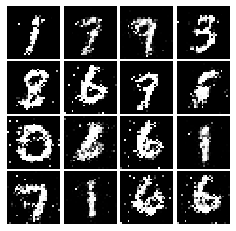

Epoch: 6, Iter: 3260, D: 1.354, G:0.9057


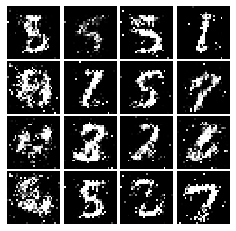

Epoch: 6, Iter: 3280, D: 1.377, G:0.8977


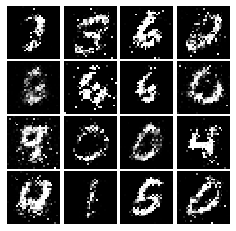

Epoch: 7, Iter: 3300, D: 1.219, G:0.9502


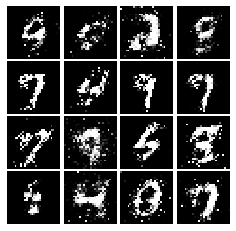

Epoch: 7, Iter: 3320, D: 1.319, G:0.7855


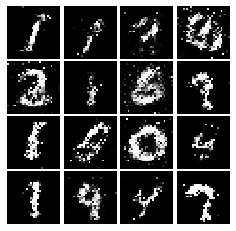

Epoch: 7, Iter: 3340, D: 1.364, G:0.8028


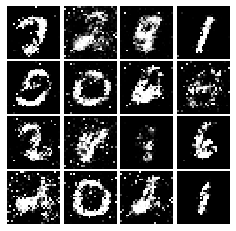

Epoch: 7, Iter: 3360, D: 1.457, G:0.8206


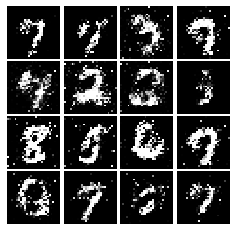

Epoch: 7, Iter: 3380, D: 1.349, G:0.8964


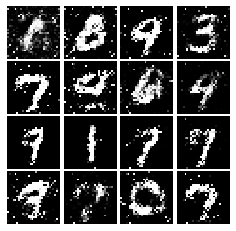

Epoch: 7, Iter: 3400, D: 1.4, G:0.8224


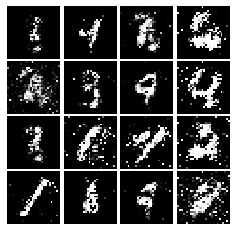

Epoch: 7, Iter: 3420, D: 1.295, G:0.7502


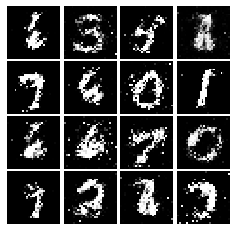

Epoch: 7, Iter: 3440, D: 1.398, G:0.7591


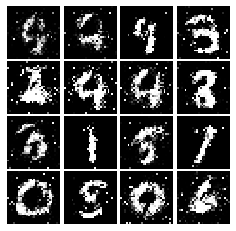

Epoch: 7, Iter: 3460, D: 1.301, G:0.8036


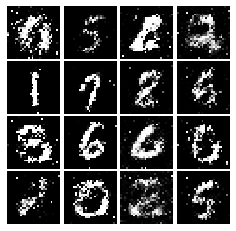

Epoch: 7, Iter: 3480, D: 1.365, G:0.746


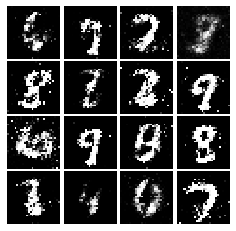

Epoch: 7, Iter: 3500, D: 1.324, G:0.8371


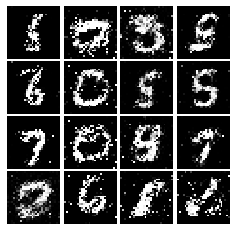

Epoch: 7, Iter: 3520, D: 1.418, G:0.8762


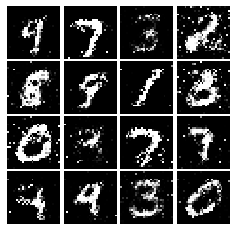

Epoch: 7, Iter: 3540, D: 1.294, G:0.7566


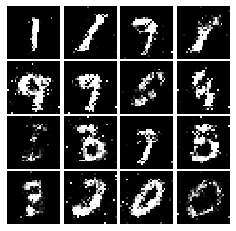

Epoch: 7, Iter: 3560, D: 1.339, G:0.9037


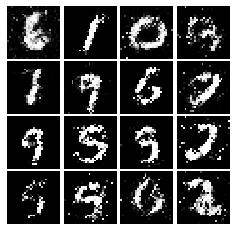

Epoch: 7, Iter: 3580, D: 1.366, G:0.8243


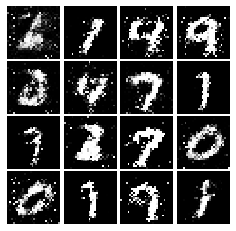

Epoch: 7, Iter: 3600, D: 1.283, G:0.8166


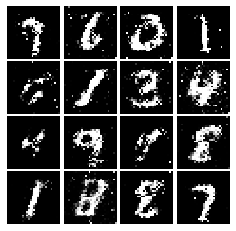

Epoch: 7, Iter: 3620, D: 1.311, G:0.8149


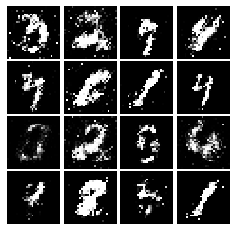

Epoch: 7, Iter: 3640, D: 1.332, G:0.7795


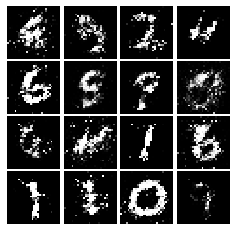

Epoch: 7, Iter: 3660, D: 1.325, G:0.863


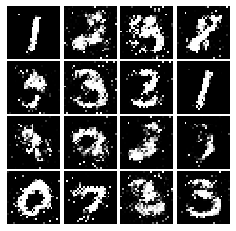

Epoch: 7, Iter: 3680, D: 1.256, G:0.8264


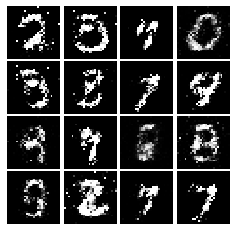

Epoch: 7, Iter: 3700, D: 1.329, G:0.796


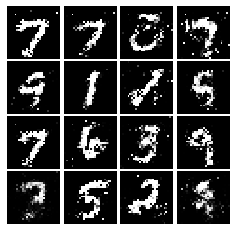

Epoch: 7, Iter: 3720, D: 1.331, G:0.8569


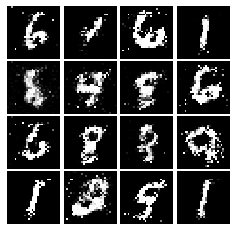

Epoch: 7, Iter: 3740, D: 1.343, G:0.7645


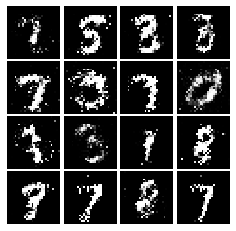

Epoch: 8, Iter: 3760, D: 1.479, G:0.7303


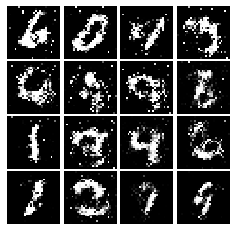

Epoch: 8, Iter: 3780, D: 1.316, G:0.7923


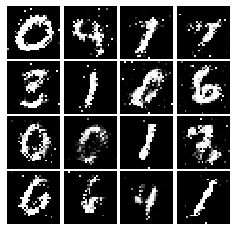

Epoch: 8, Iter: 3800, D: 1.343, G:0.9045


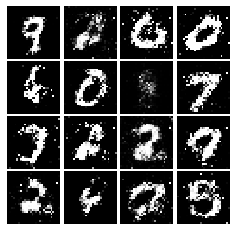

Epoch: 8, Iter: 3820, D: 1.257, G:0.7853


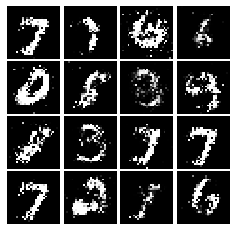

Epoch: 8, Iter: 3840, D: 1.311, G:0.905


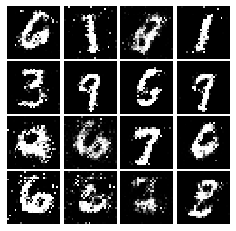

Epoch: 8, Iter: 3860, D: 1.233, G:0.9491


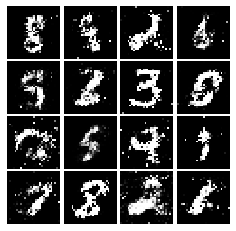

Epoch: 8, Iter: 3880, D: 1.345, G:0.8385


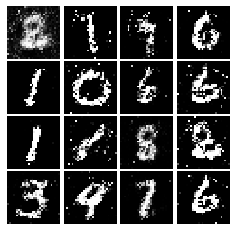

Epoch: 8, Iter: 3900, D: 1.393, G:0.7949


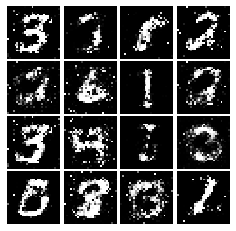

Epoch: 8, Iter: 3920, D: 1.322, G:0.8225


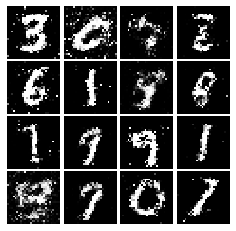

Epoch: 8, Iter: 3940, D: 1.379, G:0.8183


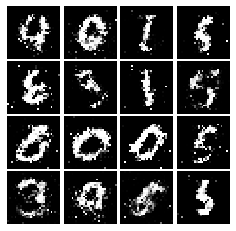

Epoch: 8, Iter: 3960, D: 1.368, G:0.8772


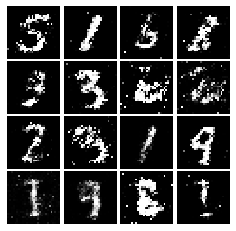

Epoch: 8, Iter: 3980, D: 1.326, G:0.841


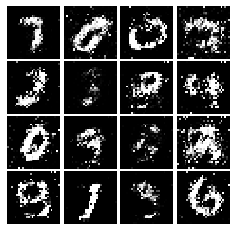

Epoch: 8, Iter: 4000, D: 1.363, G:0.8188


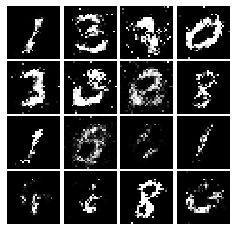

Epoch: 8, Iter: 4020, D: 1.321, G:0.8901


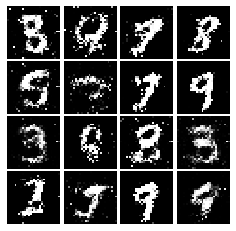

Epoch: 8, Iter: 4040, D: 1.221, G:0.773


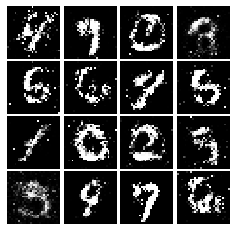

Epoch: 8, Iter: 4060, D: 1.294, G:0.9488


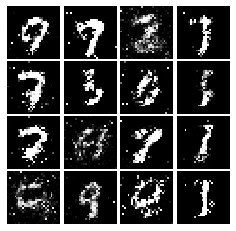

Epoch: 8, Iter: 4080, D: 1.52, G:0.8581


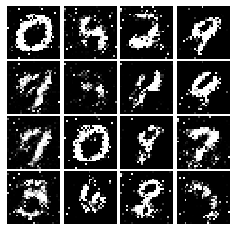

Epoch: 8, Iter: 4100, D: 1.298, G:0.8795


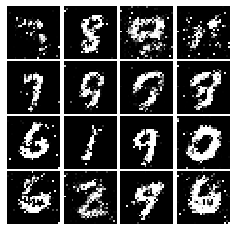

Epoch: 8, Iter: 4120, D: 1.305, G:0.799


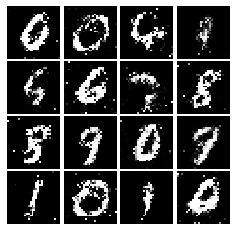

Epoch: 8, Iter: 4140, D: 1.355, G:0.8949


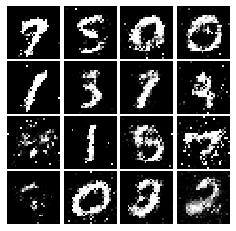

Epoch: 8, Iter: 4160, D: 1.302, G:0.8418


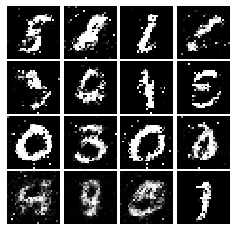

Epoch: 8, Iter: 4180, D: 1.28, G:0.8049


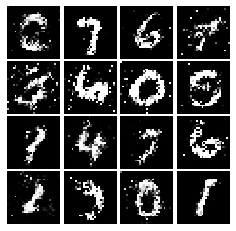

Epoch: 8, Iter: 4200, D: 1.375, G:0.8406


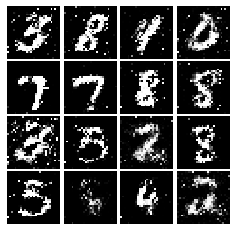

Epoch: 8, Iter: 4220, D: 1.291, G:0.8936


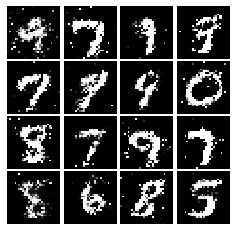

Epoch: 9, Iter: 4240, D: 1.393, G:0.6356


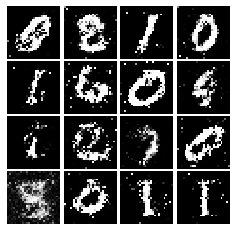

Epoch: 9, Iter: 4260, D: 1.356, G:0.7905


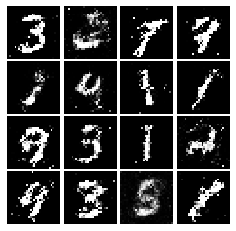

Epoch: 9, Iter: 4280, D: 1.398, G:0.7924


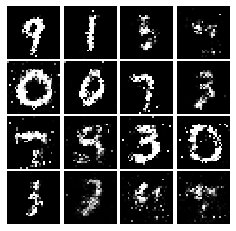

Epoch: 9, Iter: 4300, D: 1.402, G:0.7877


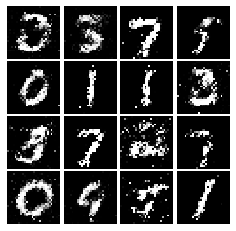

Epoch: 9, Iter: 4320, D: 1.355, G:0.8127


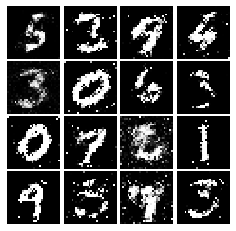

Epoch: 9, Iter: 4340, D: 1.293, G:0.8


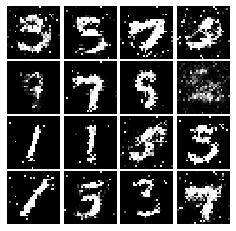

Epoch: 9, Iter: 4360, D: 1.304, G:0.9929


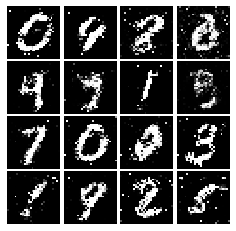

Epoch: 9, Iter: 4380, D: 1.341, G:0.8638


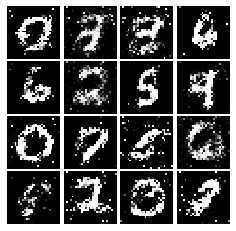

Epoch: 9, Iter: 4400, D: 1.179, G:0.92


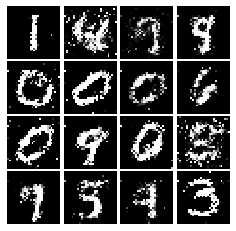

Epoch: 9, Iter: 4420, D: 1.28, G:0.9143


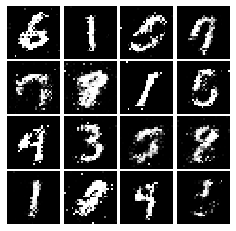

Epoch: 9, Iter: 4440, D: 1.301, G:0.8062


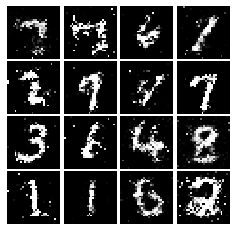

Epoch: 9, Iter: 4460, D: 1.27, G:0.7503


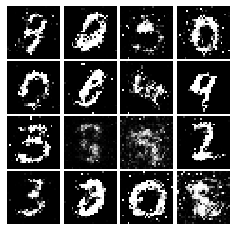

Epoch: 9, Iter: 4480, D: 1.315, G:0.7526


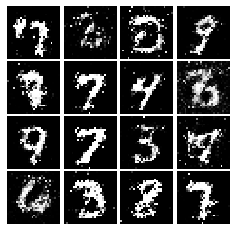

Epoch: 9, Iter: 4500, D: 1.471, G:0.7748


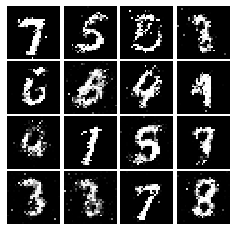

Epoch: 9, Iter: 4520, D: 1.305, G:0.7653


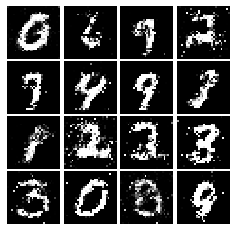

Epoch: 9, Iter: 4540, D: 1.374, G:0.7917


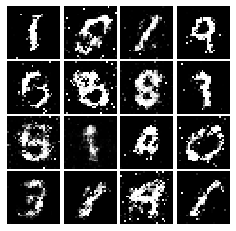

Epoch: 9, Iter: 4560, D: 1.365, G:0.8478


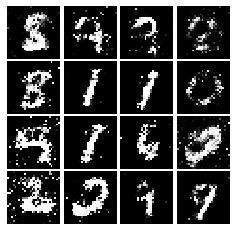

Epoch: 9, Iter: 4580, D: 1.284, G:0.7779


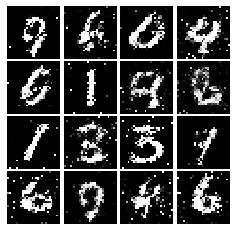

Epoch: 9, Iter: 4600, D: 1.478, G:0.722


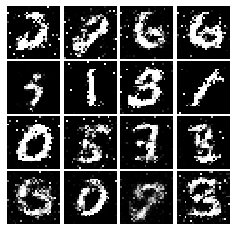

Epoch: 9, Iter: 4620, D: 1.333, G:0.828


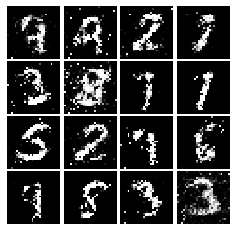

Epoch: 9, Iter: 4640, D: 1.354, G:0.758


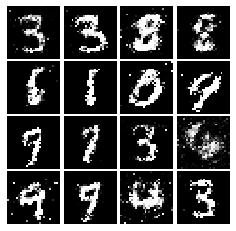

Epoch: 9, Iter: 4660, D: 1.336, G:0.8071


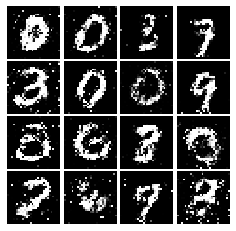

Epoch: 9, Iter: 4680, D: 1.381, G:0.7724


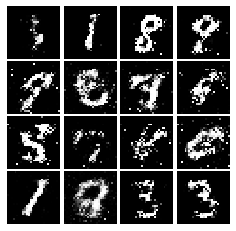

Final images


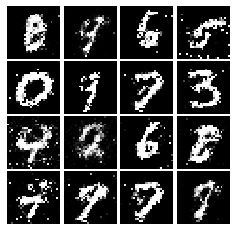

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [0]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean(tf.square(scores_real - 1))
    loss +=  0.5 *  tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - 1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [22]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.1314, G:0.3757


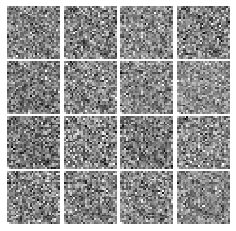

Epoch: 0, Iter: 20, D: 0.03744, G:0.9752


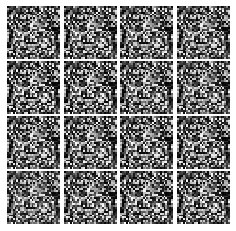

Epoch: 0, Iter: 40, D: 0.02664, G:0.6992


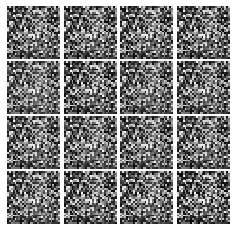

Epoch: 0, Iter: 60, D: 0.03122, G:0.8058


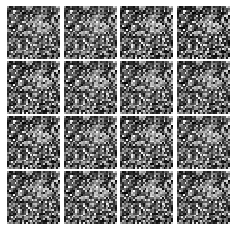

Epoch: 0, Iter: 80, D: 0.3444, G:0.3522


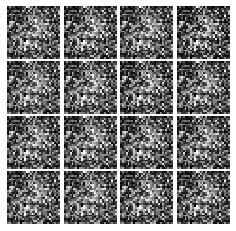

Epoch: 0, Iter: 100, D: 0.02625, G:0.5351


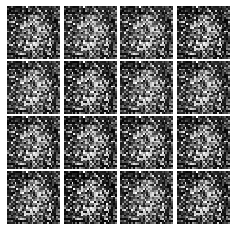

Epoch: 0, Iter: 120, D: 0.09396, G:0.5327


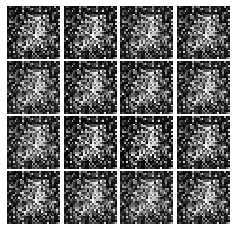

Epoch: 0, Iter: 140, D: 0.04149, G:0.6524


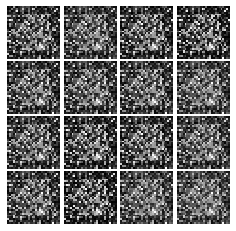

Epoch: 0, Iter: 160, D: 0.09801, G:0.4462


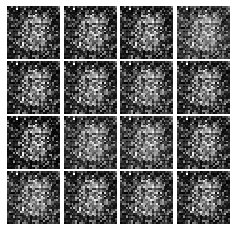

Epoch: 0, Iter: 180, D: 0.7666, G:1.483


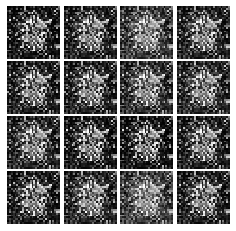

Epoch: 0, Iter: 200, D: 0.2123, G:0.2236


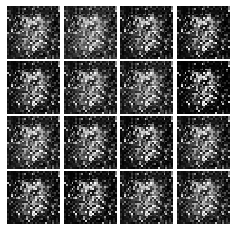

Epoch: 0, Iter: 220, D: 0.1517, G:0.476


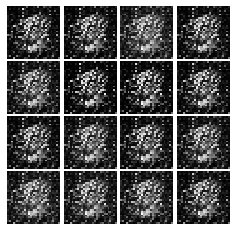

Epoch: 0, Iter: 240, D: 0.1748, G:0.422


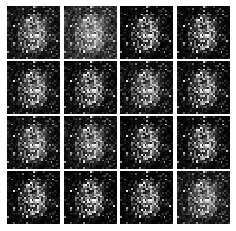

Epoch: 0, Iter: 260, D: 0.1288, G:0.4193


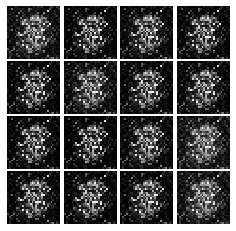

Epoch: 0, Iter: 280, D: 0.1346, G:0.3629


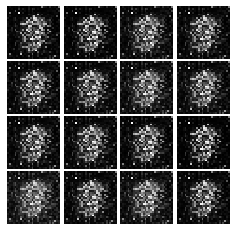

Epoch: 0, Iter: 300, D: 0.192, G:0.2508


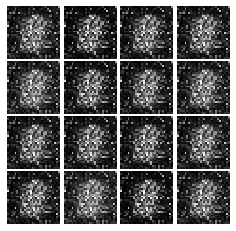

Epoch: 0, Iter: 320, D: 0.1647, G:0.8522


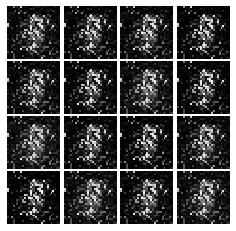

Epoch: 0, Iter: 340, D: 0.09458, G:0.3975


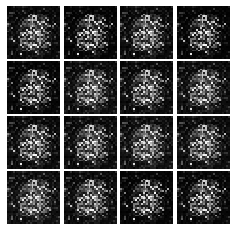

Epoch: 0, Iter: 360, D: 0.1692, G:0.4221


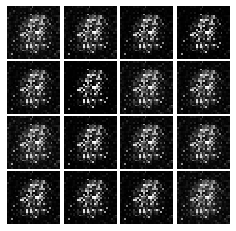

Epoch: 0, Iter: 380, D: 0.1159, G:0.4225


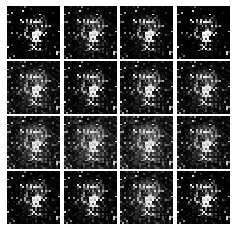

Epoch: 0, Iter: 400, D: 0.07185, G:0.545


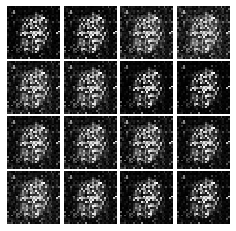

Epoch: 0, Iter: 420, D: 0.2336, G:0.2954


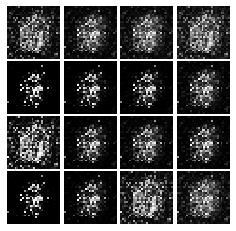

Epoch: 0, Iter: 440, D: 0.1423, G:0.3821


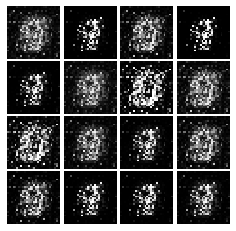

Epoch: 0, Iter: 460, D: 0.1483, G:0.9529


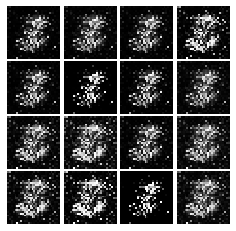

Epoch: 1, Iter: 480, D: 0.0891, G:0.3189


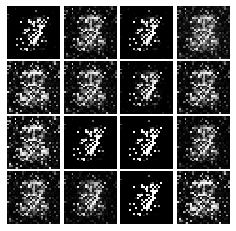

Epoch: 1, Iter: 500, D: 0.1193, G:0.4282


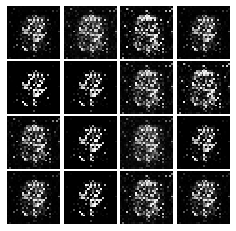

Epoch: 1, Iter: 520, D: 0.06662, G:0.4799


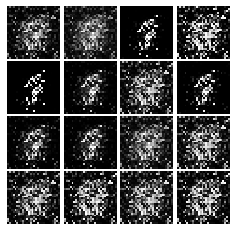

Epoch: 1, Iter: 540, D: 0.1291, G:0.6248


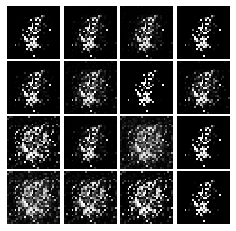

Epoch: 1, Iter: 560, D: 0.1174, G:0.3206


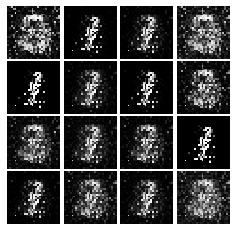

Epoch: 1, Iter: 580, D: 0.2277, G:0.4643


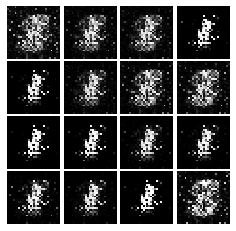

Epoch: 1, Iter: 600, D: 0.1059, G:0.3591


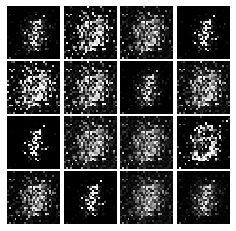

Epoch: 1, Iter: 620, D: 0.1196, G:0.4773


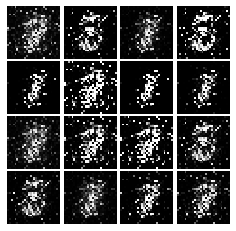

Epoch: 1, Iter: 640, D: 0.5746, G:0.06355


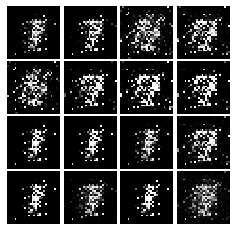

Epoch: 1, Iter: 660, D: 0.1055, G:0.4127


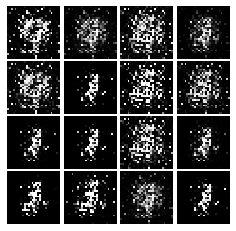

Epoch: 1, Iter: 680, D: 0.05521, G:0.4333


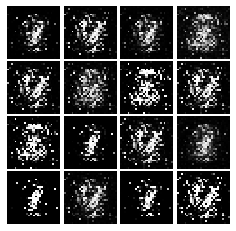

Epoch: 1, Iter: 700, D: 0.1765, G:0.2609


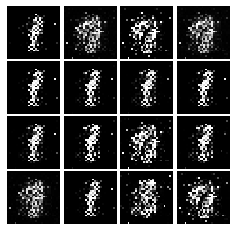

Epoch: 1, Iter: 720, D: 0.1481, G:0.278


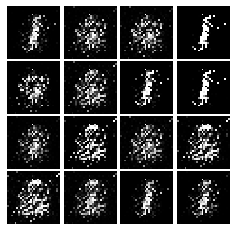

Epoch: 1, Iter: 740, D: 0.09955, G:0.6328


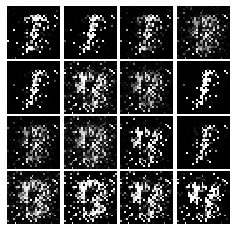

Epoch: 1, Iter: 760, D: 0.098, G:0.501


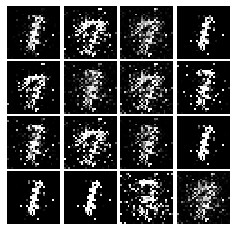

Epoch: 1, Iter: 780, D: 0.08178, G:0.4229


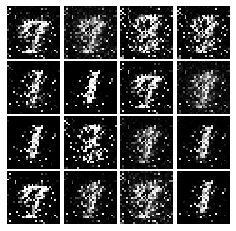

Epoch: 1, Iter: 800, D: 0.1352, G:0.2596


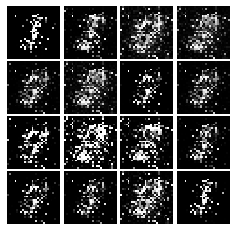

Epoch: 1, Iter: 820, D: 0.08174, G:0.4056


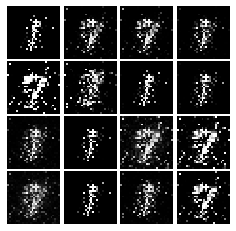

Epoch: 1, Iter: 840, D: 0.09897, G:0.3251


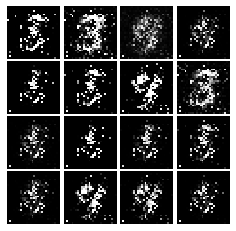

Epoch: 1, Iter: 860, D: 0.1119, G:0.4365


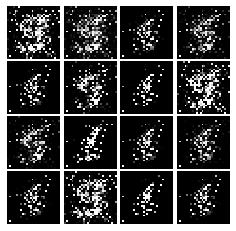

Epoch: 1, Iter: 880, D: 0.1053, G:0.5597


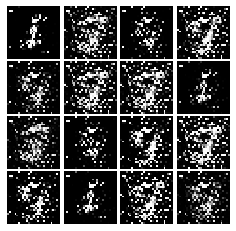

Epoch: 1, Iter: 900, D: 0.1043, G:0.4218


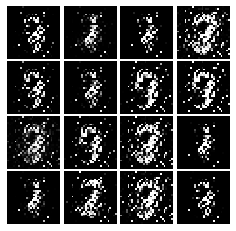

Epoch: 1, Iter: 920, D: 0.06279, G:0.4641


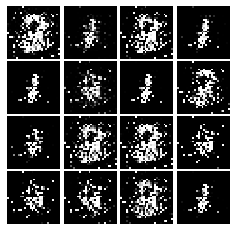

Epoch: 2, Iter: 940, D: 0.1554, G:0.7616


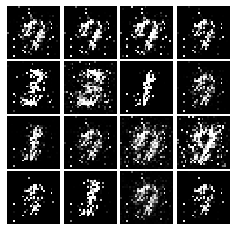

Epoch: 2, Iter: 960, D: 0.1173, G:0.4058


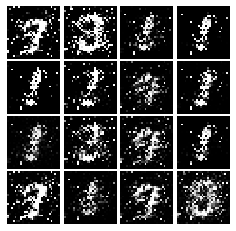

Epoch: 2, Iter: 980, D: 0.236, G:0.6178


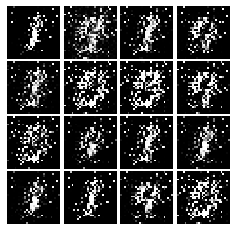

Epoch: 2, Iter: 1000, D: 0.2056, G:0.2451


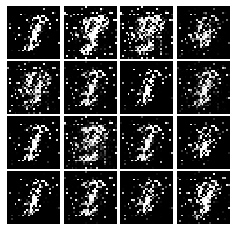

Epoch: 2, Iter: 1020, D: 0.1163, G:0.3735


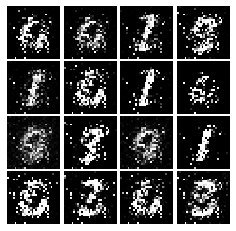

Epoch: 2, Iter: 1040, D: 0.103, G:0.4263


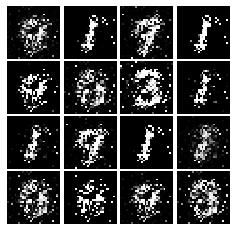

Epoch: 2, Iter: 1060, D: 0.09986, G:0.3141


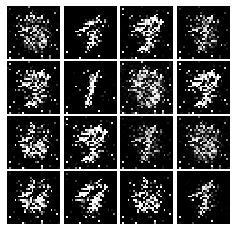

Epoch: 2, Iter: 1080, D: 0.1325, G:0.747


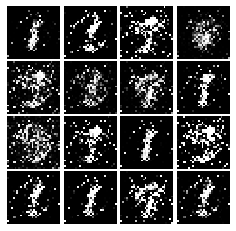

Epoch: 2, Iter: 1100, D: 0.1003, G:0.2762


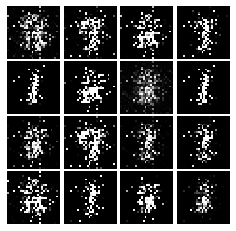

Epoch: 2, Iter: 1120, D: 0.1243, G:0.6657


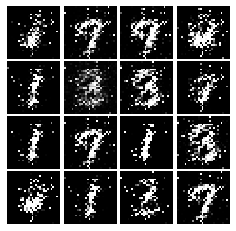

Epoch: 2, Iter: 1140, D: 0.0897, G:0.2432


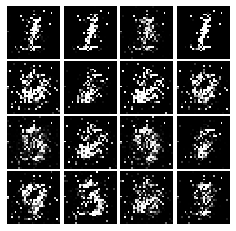

Epoch: 2, Iter: 1160, D: 0.1199, G:0.5328


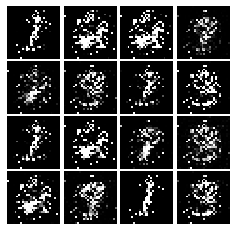

Epoch: 2, Iter: 1180, D: 0.1068, G:0.3916


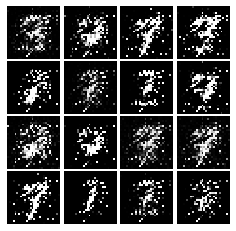

Epoch: 2, Iter: 1200, D: 0.1199, G:0.4703


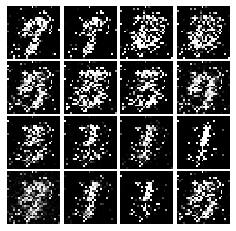

Epoch: 2, Iter: 1220, D: 0.1317, G:0.3569


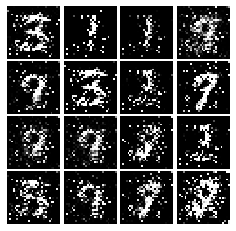

Epoch: 2, Iter: 1240, D: 0.4357, G:0.04324


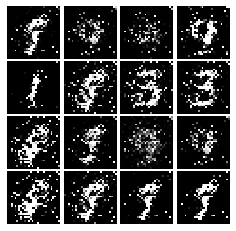

Epoch: 2, Iter: 1260, D: 0.1767, G:0.3478


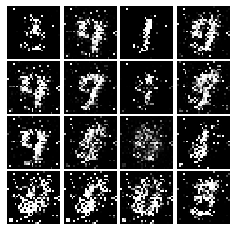

Epoch: 2, Iter: 1280, D: 0.152, G:0.3588


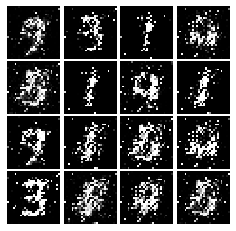

Epoch: 2, Iter: 1300, D: 0.3066, G:0.2465


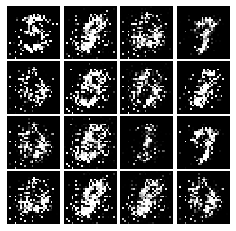

Epoch: 2, Iter: 1320, D: 0.1537, G:0.359


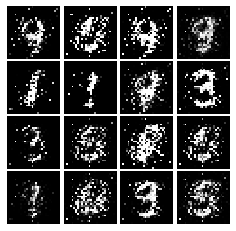

Epoch: 2, Iter: 1340, D: 0.1532, G:0.3061


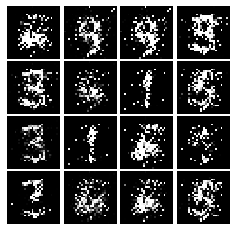

Epoch: 2, Iter: 1360, D: 0.2011, G:0.4141


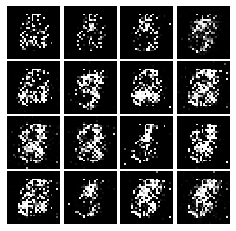

Epoch: 2, Iter: 1380, D: 0.185, G:0.2514


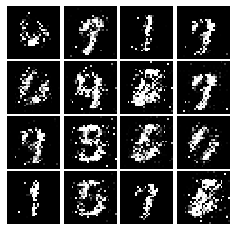

Epoch: 2, Iter: 1400, D: 0.1677, G:0.2747


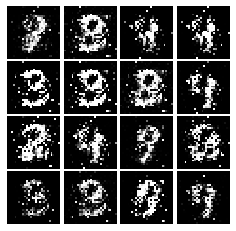

Epoch: 3, Iter: 1420, D: 0.1331, G:0.2603


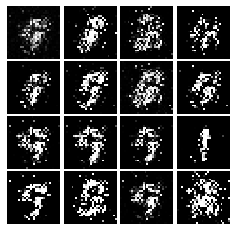

Epoch: 3, Iter: 1440, D: 0.2203, G:0.1896


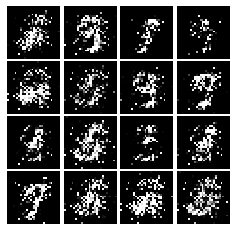

Epoch: 3, Iter: 1460, D: 0.1958, G:0.3558


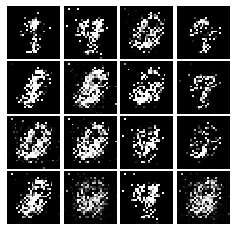

Epoch: 3, Iter: 1480, D: 0.1499, G:0.4636


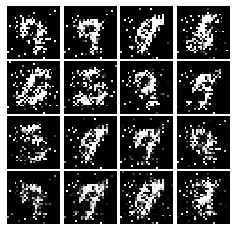

Epoch: 3, Iter: 1500, D: 0.1713, G:0.2468


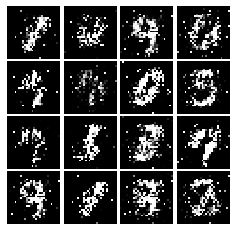

Epoch: 3, Iter: 1520, D: 0.1612, G:0.4321


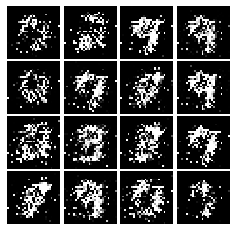

Epoch: 3, Iter: 1540, D: 0.1503, G:0.2988


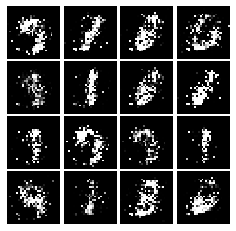

Epoch: 3, Iter: 1560, D: 0.2095, G:0.1566


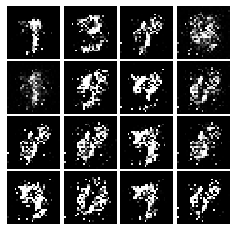

Epoch: 3, Iter: 1580, D: 0.182, G:0.2991


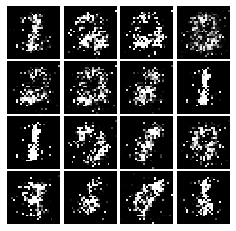

Epoch: 3, Iter: 1600, D: 0.1624, G:0.3515


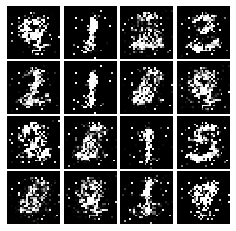

Epoch: 3, Iter: 1620, D: 0.1728, G:0.298


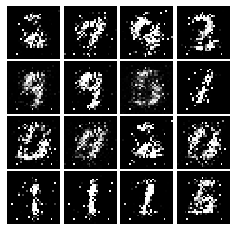

Epoch: 3, Iter: 1640, D: 0.1546, G:0.2338


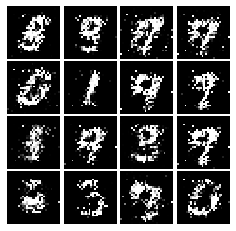

Epoch: 3, Iter: 1660, D: 0.1679, G:0.3666


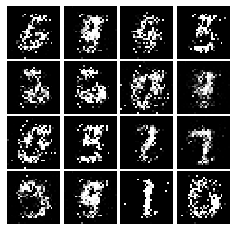

Epoch: 3, Iter: 1680, D: 0.1817, G:0.2064


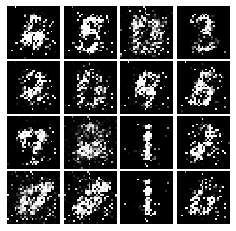

Epoch: 3, Iter: 1700, D: 0.2078, G:0.2289


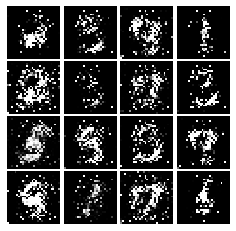

Epoch: 3, Iter: 1720, D: 0.2038, G:0.2795


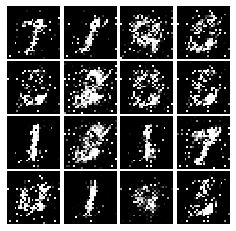

Epoch: 3, Iter: 1740, D: 0.2152, G:0.1544


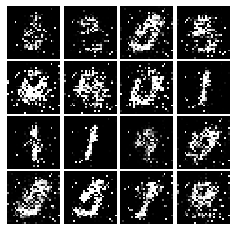

Epoch: 3, Iter: 1760, D: 0.1733, G:0.2072


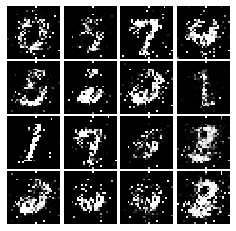

Epoch: 3, Iter: 1780, D: 0.1902, G:0.1865


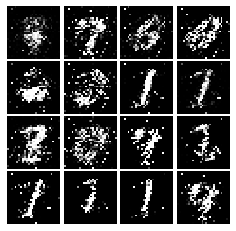

Epoch: 3, Iter: 1800, D: 0.2374, G:0.2254


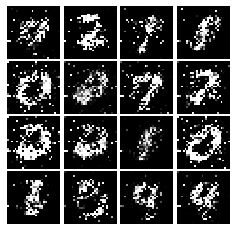

Epoch: 3, Iter: 1820, D: 0.2021, G:0.2145


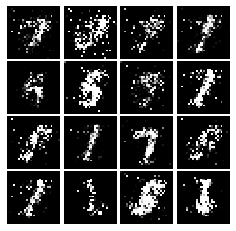

Epoch: 3, Iter: 1840, D: 0.1899, G:0.2077


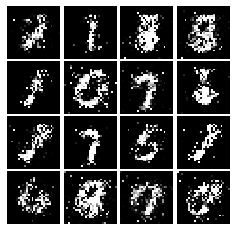

Epoch: 3, Iter: 1860, D: 0.1989, G:0.2396


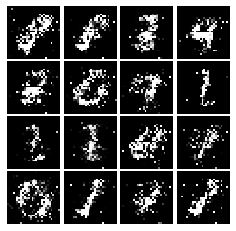

Epoch: 4, Iter: 1880, D: 0.1813, G:0.2087


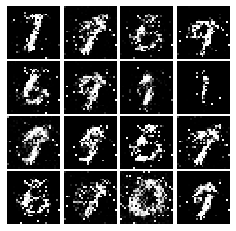

Epoch: 4, Iter: 1900, D: 0.2004, G:0.2387


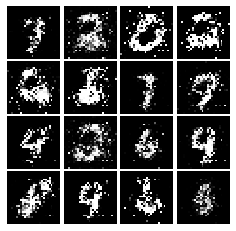

Epoch: 4, Iter: 1920, D: 0.2034, G:0.1815


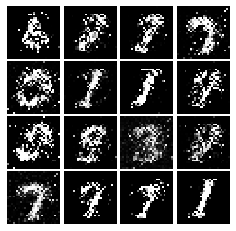

Epoch: 4, Iter: 1940, D: 0.1914, G:0.2395


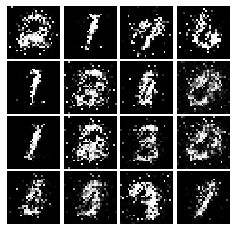

Epoch: 4, Iter: 1960, D: 0.2209, G:0.2757


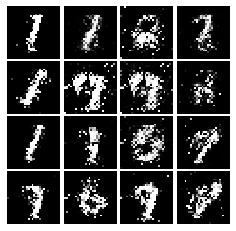

Epoch: 4, Iter: 1980, D: 0.2208, G:0.1659


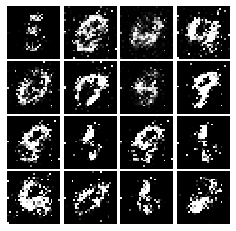

Epoch: 4, Iter: 2000, D: 0.2135, G:0.1759


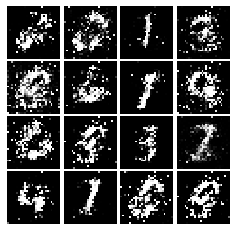

Epoch: 4, Iter: 2020, D: 0.2026, G:0.205


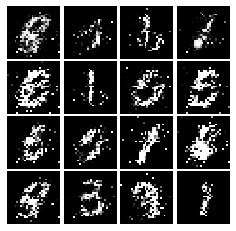

Epoch: 4, Iter: 2040, D: 0.2184, G:0.1962


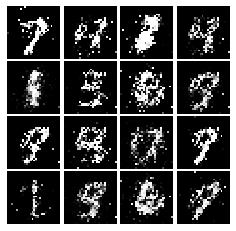

Epoch: 4, Iter: 2060, D: 0.2554, G:0.2102


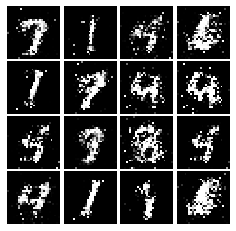

Epoch: 4, Iter: 2080, D: 0.1931, G:0.2032


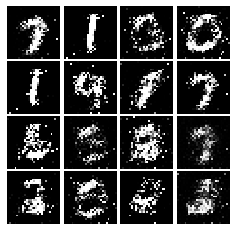

Epoch: 4, Iter: 2100, D: 0.2054, G:0.1833


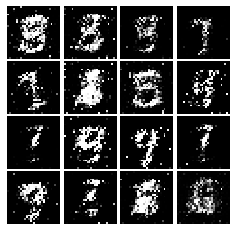

Epoch: 4, Iter: 2120, D: 0.1951, G:0.1892


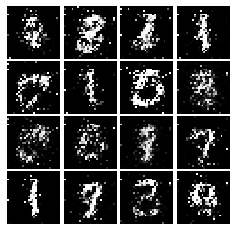

Epoch: 4, Iter: 2140, D: 0.1985, G:0.2059


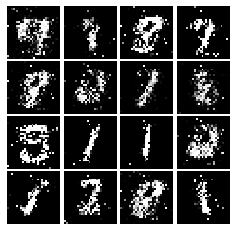

Epoch: 4, Iter: 2160, D: 0.2283, G:0.1916


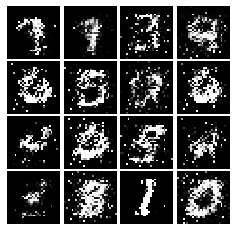

Epoch: 4, Iter: 2180, D: 0.2259, G:0.2202


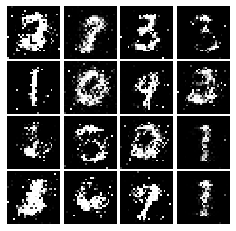

Epoch: 4, Iter: 2200, D: 0.1905, G:0.2014


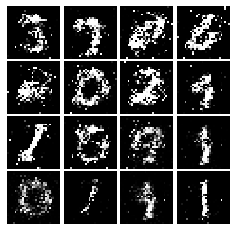

Epoch: 4, Iter: 2220, D: 0.1971, G:0.08061


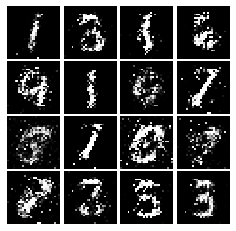

Epoch: 4, Iter: 2240, D: 0.2017, G:0.2135


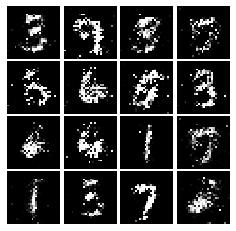

Epoch: 4, Iter: 2260, D: 0.209, G:0.2429


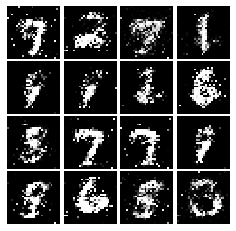

Epoch: 4, Iter: 2280, D: 0.2036, G:0.2562


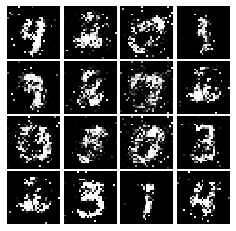

Epoch: 4, Iter: 2300, D: 0.1976, G:0.2353


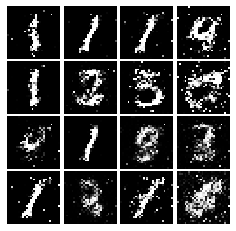

Epoch: 4, Iter: 2320, D: 0.1803, G:0.192


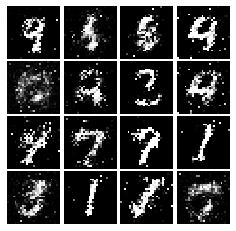

Epoch: 4, Iter: 2340, D: 0.188, G:0.2186


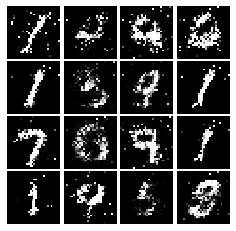

Epoch: 5, Iter: 2360, D: 0.2335, G:0.2242


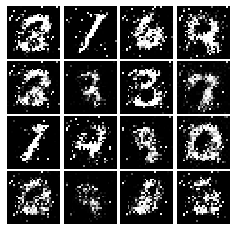

Epoch: 5, Iter: 2380, D: 0.2054, G:0.2525


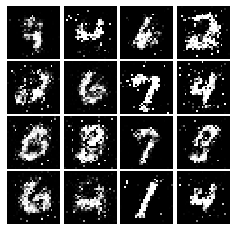

Epoch: 5, Iter: 2400, D: 0.2269, G:0.1785


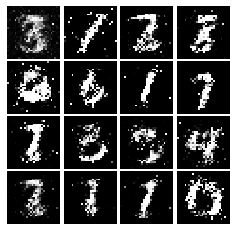

Epoch: 5, Iter: 2420, D: 0.21, G:0.1485


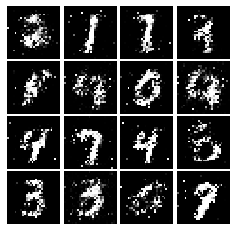

Epoch: 5, Iter: 2440, D: 0.2194, G:0.1675


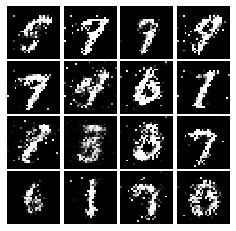

Epoch: 5, Iter: 2460, D: 0.2199, G:0.2031


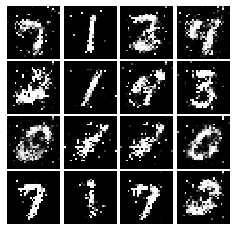

Epoch: 5, Iter: 2480, D: 0.2118, G:0.2212


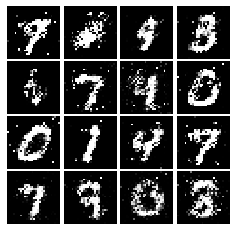

Epoch: 5, Iter: 2500, D: 0.1859, G:0.2665


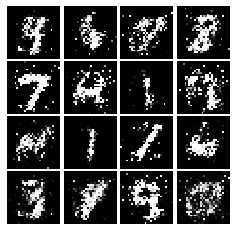

Epoch: 5, Iter: 2520, D: 0.1994, G:0.234


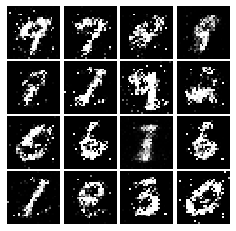

Epoch: 5, Iter: 2540, D: 0.2371, G:0.1873


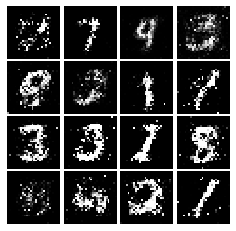

Epoch: 5, Iter: 2560, D: 0.1855, G:0.2029


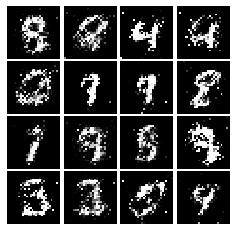

Epoch: 5, Iter: 2580, D: 0.2133, G:0.2067


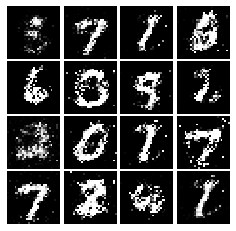

Epoch: 5, Iter: 2600, D: 0.2372, G:0.1478


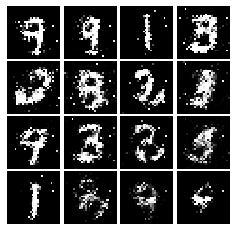

Epoch: 5, Iter: 2620, D: 0.2164, G:0.2142


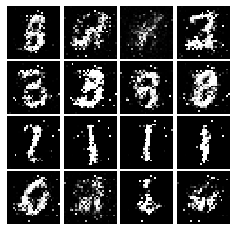

Epoch: 5, Iter: 2640, D: 0.2041, G:0.1974


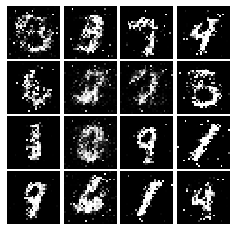

Epoch: 5, Iter: 2660, D: 0.2146, G:0.1948


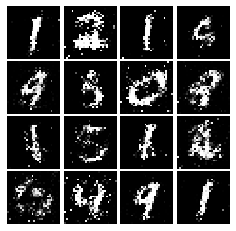

Epoch: 5, Iter: 2680, D: 0.2283, G:0.1916


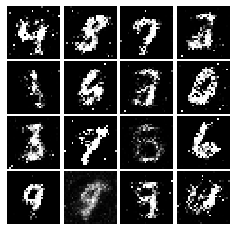

Epoch: 5, Iter: 2700, D: 0.2187, G:0.1904


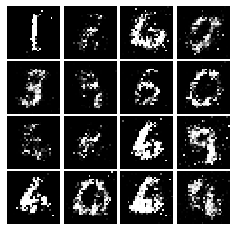

Epoch: 5, Iter: 2720, D: 0.221, G:0.1389


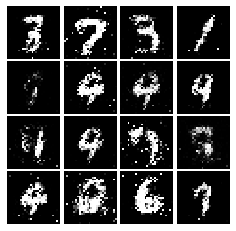

Epoch: 5, Iter: 2740, D: 0.2282, G:0.1978


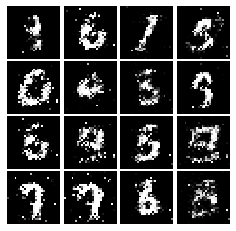

Epoch: 5, Iter: 2760, D: 0.2251, G:0.1667


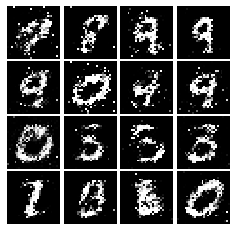

Epoch: 5, Iter: 2780, D: 0.2142, G:0.166


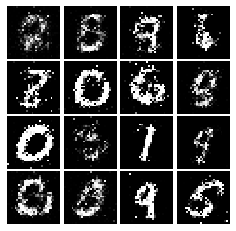

Epoch: 5, Iter: 2800, D: 0.2146, G:0.1846


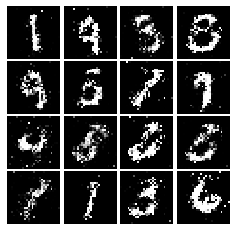

Epoch: 6, Iter: 2820, D: 0.2193, G:0.1363


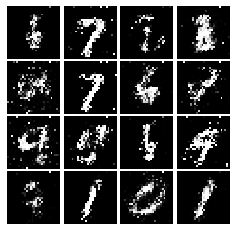

Epoch: 6, Iter: 2840, D: 0.2429, G:0.1877


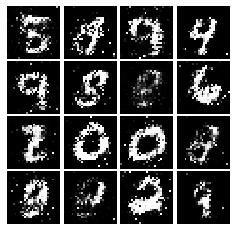

Epoch: 6, Iter: 2860, D: 0.231, G:0.2754


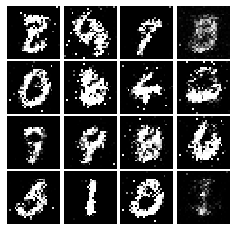

Epoch: 6, Iter: 2880, D: 0.2014, G:0.1791


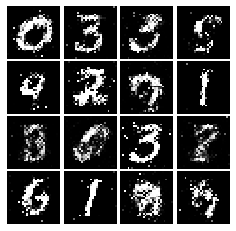

Epoch: 6, Iter: 2900, D: 0.2206, G:0.1781


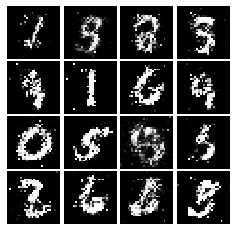

Epoch: 6, Iter: 2920, D: 0.2253, G:0.1689


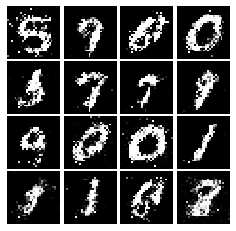

Epoch: 6, Iter: 2940, D: 0.24, G:0.1872


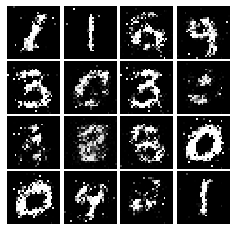

Epoch: 6, Iter: 2960, D: 0.2197, G:0.1935


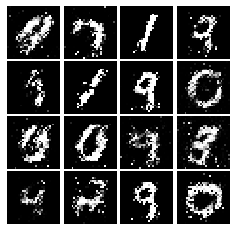

Epoch: 6, Iter: 2980, D: 0.2306, G:0.2131


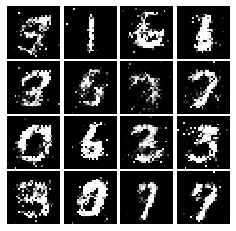

Epoch: 6, Iter: 3000, D: 0.2289, G:0.168


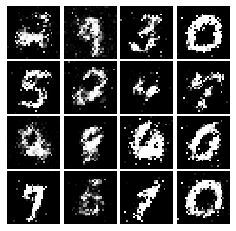

Epoch: 6, Iter: 3020, D: 0.2346, G:0.1646


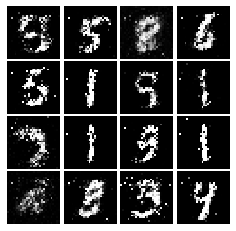

Epoch: 6, Iter: 3040, D: 0.2245, G:0.1849


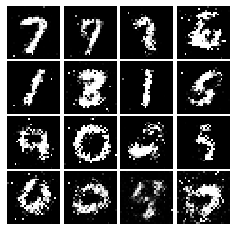

Epoch: 6, Iter: 3060, D: 0.2412, G:0.1774


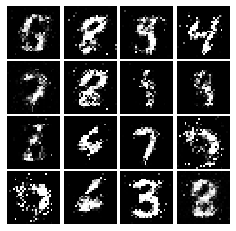

Epoch: 6, Iter: 3080, D: 0.2272, G:0.1842


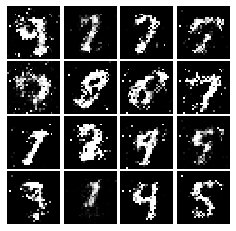

Epoch: 6, Iter: 3100, D: 0.2011, G:0.1905


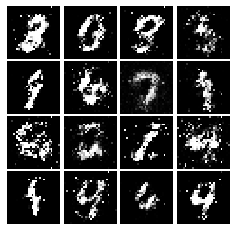

Epoch: 6, Iter: 3120, D: 0.2354, G:0.1484


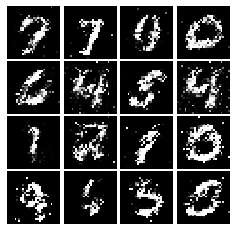

Epoch: 6, Iter: 3140, D: 0.2245, G:0.1657


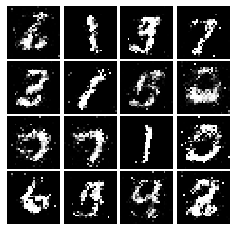

Epoch: 6, Iter: 3160, D: 0.2152, G:0.1731


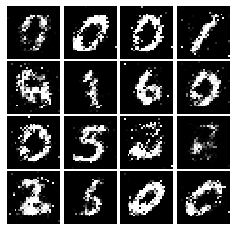

Epoch: 6, Iter: 3180, D: 0.2127, G:0.1973


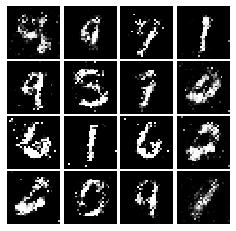

Epoch: 6, Iter: 3200, D: 0.2176, G:0.2467


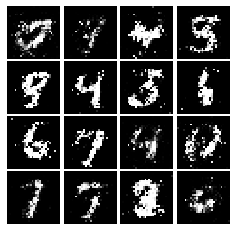

Epoch: 6, Iter: 3220, D: 0.2214, G:0.1794


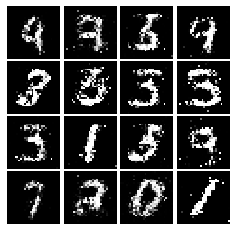

Epoch: 6, Iter: 3240, D: 0.2198, G:0.2228


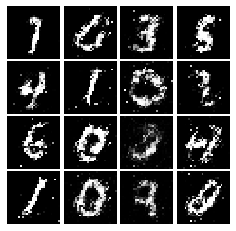

Epoch: 6, Iter: 3260, D: 0.2486, G:0.1788


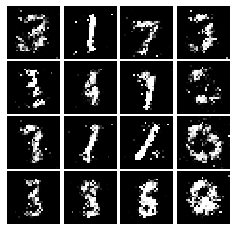

Epoch: 6, Iter: 3280, D: 0.2466, G:0.1706


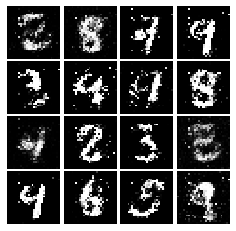

Epoch: 7, Iter: 3300, D: 0.1983, G:0.1744


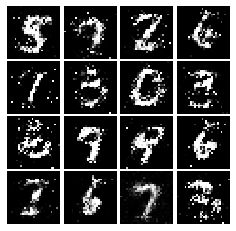

Epoch: 7, Iter: 3320, D: 0.2199, G:0.1441


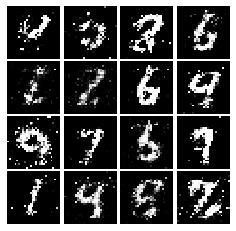

Epoch: 7, Iter: 3340, D: 0.2123, G:0.1863


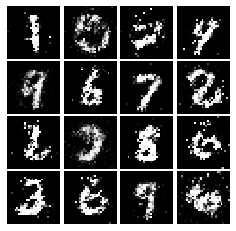

Epoch: 7, Iter: 3360, D: 0.2132, G:0.1718


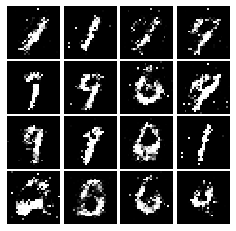

Epoch: 7, Iter: 3380, D: 0.2145, G:0.2051


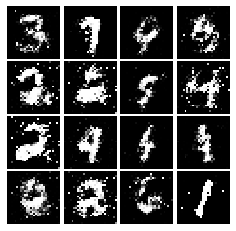

Epoch: 7, Iter: 3400, D: 0.2519, G:0.2205


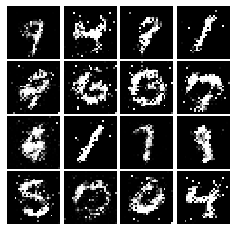

Epoch: 7, Iter: 3420, D: 0.2449, G:0.1627


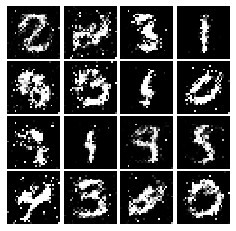

Epoch: 7, Iter: 3440, D: 0.2591, G:0.2037


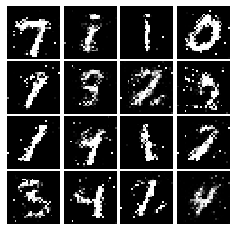

Epoch: 7, Iter: 3460, D: 0.1992, G:0.1506


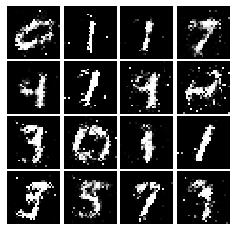

Epoch: 7, Iter: 3480, D: 0.2201, G:0.196


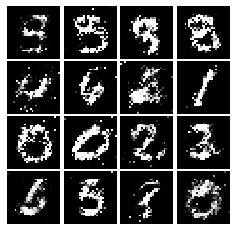

Epoch: 7, Iter: 3500, D: 0.2075, G:0.1515


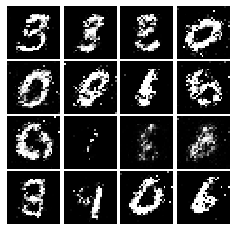

Epoch: 7, Iter: 3520, D: 0.247, G:0.1625


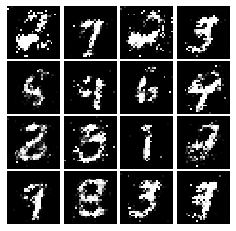

Epoch: 7, Iter: 3540, D: 0.2034, G:0.1687


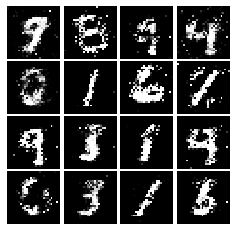

Epoch: 7, Iter: 3560, D: 0.198, G:0.1714


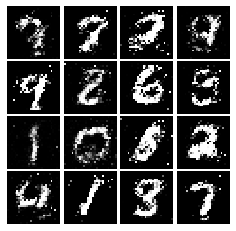

Epoch: 7, Iter: 3580, D: 0.2367, G:0.1695


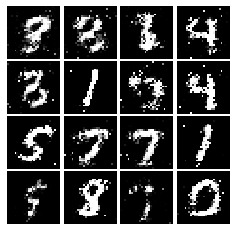

Epoch: 7, Iter: 3600, D: 0.2187, G:0.1711


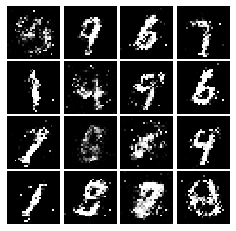

Epoch: 7, Iter: 3620, D: 0.2215, G:0.1883


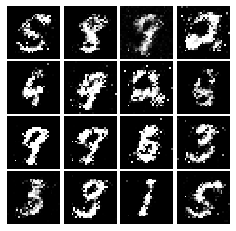

Epoch: 7, Iter: 3640, D: 0.2265, G:0.1692


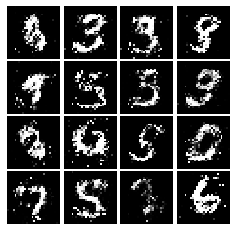

Epoch: 7, Iter: 3660, D: 0.2242, G:0.1804


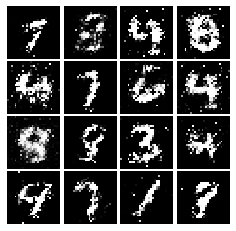

Epoch: 7, Iter: 3680, D: 0.2011, G:0.18


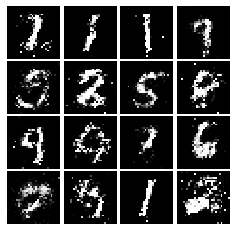

Epoch: 7, Iter: 3700, D: 0.2184, G:0.1941


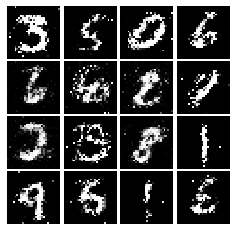

Epoch: 7, Iter: 3720, D: 0.2134, G:0.1743


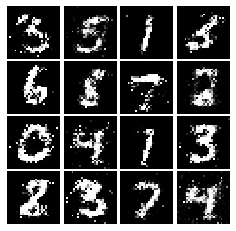

Epoch: 7, Iter: 3740, D: 0.2503, G:0.1564


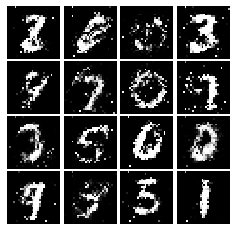

Epoch: 8, Iter: 3760, D: 0.2269, G:0.1914


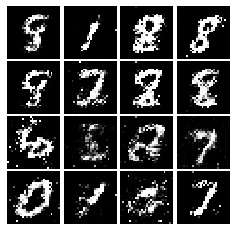

Epoch: 8, Iter: 3780, D: 0.2254, G:0.1559


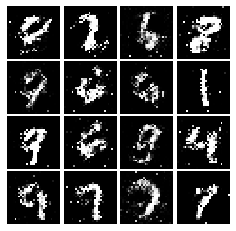

Epoch: 8, Iter: 3800, D: 0.2343, G:0.1598


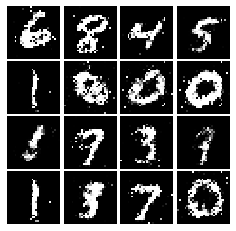

Epoch: 8, Iter: 3820, D: 0.2164, G:0.1652


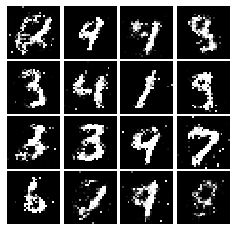

Epoch: 8, Iter: 3840, D: 0.2228, G:0.1742


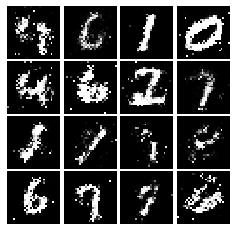

Epoch: 8, Iter: 3860, D: 0.2093, G:0.1622


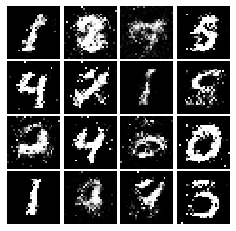

Epoch: 8, Iter: 3880, D: 0.2324, G:0.154


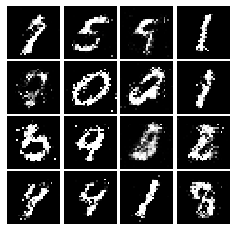

Epoch: 8, Iter: 3900, D: 0.2224, G:0.1889


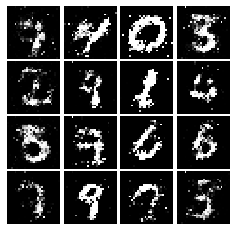

Epoch: 8, Iter: 3920, D: 0.2235, G:0.2007


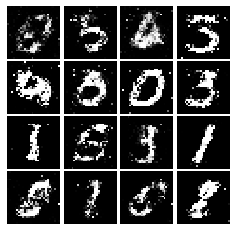

Epoch: 8, Iter: 3940, D: 0.2457, G:0.1667


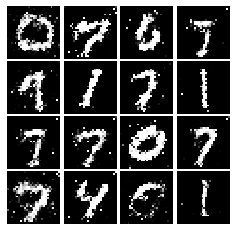

Epoch: 8, Iter: 3960, D: 0.2207, G:0.1837


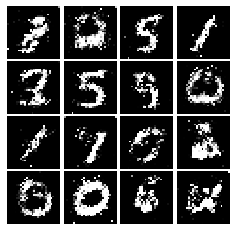

Epoch: 8, Iter: 3980, D: 0.2121, G:0.1841


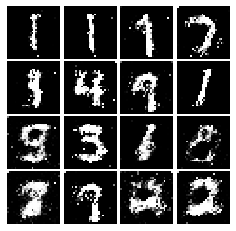

Epoch: 8, Iter: 4000, D: 0.2232, G:0.1625


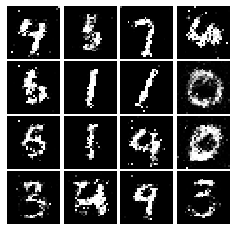

Epoch: 8, Iter: 4020, D: 0.2372, G:0.145


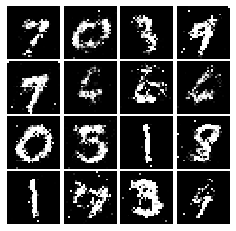

Epoch: 8, Iter: 4040, D: 0.2254, G:0.1896


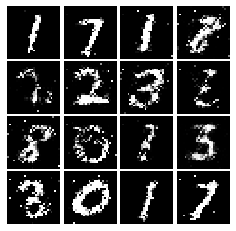

Epoch: 8, Iter: 4060, D: 0.2167, G:0.1782


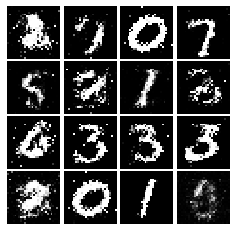

Epoch: 8, Iter: 4080, D: 0.2246, G:0.1697


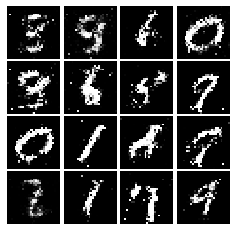

Epoch: 8, Iter: 4100, D: 0.2317, G:0.1588


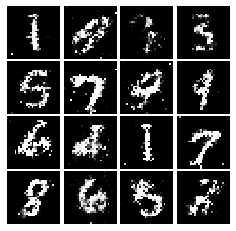

Epoch: 8, Iter: 4120, D: 0.2211, G:0.1668


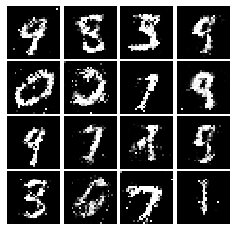

Epoch: 8, Iter: 4140, D: 0.2218, G:0.1787


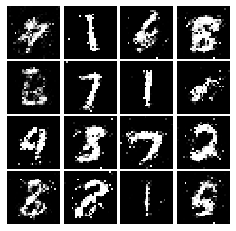

Epoch: 8, Iter: 4160, D: 0.2394, G:0.1599


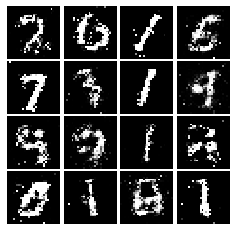

Epoch: 8, Iter: 4180, D: 0.2388, G:0.1621


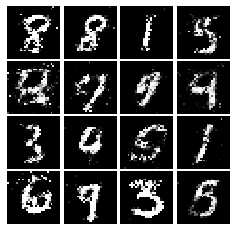

Epoch: 8, Iter: 4200, D: 0.231, G:0.1847


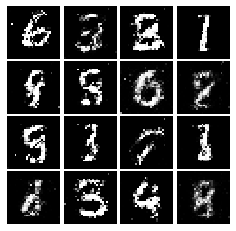

Epoch: 8, Iter: 4220, D: 0.2491, G:0.201


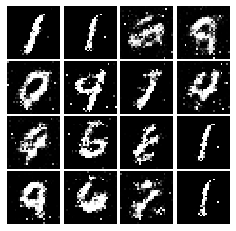

Epoch: 9, Iter: 4240, D: 0.2402, G:0.1791


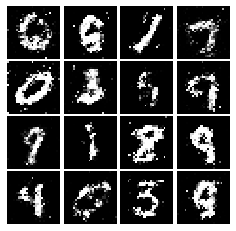

Epoch: 9, Iter: 4260, D: 0.2367, G:0.1829


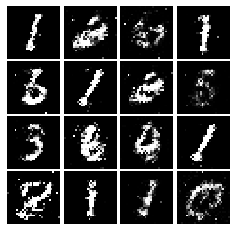

Epoch: 9, Iter: 4280, D: 0.25, G:0.1462


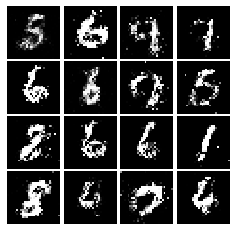

Epoch: 9, Iter: 4300, D: 0.2196, G:0.1856


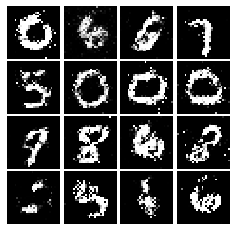

Epoch: 9, Iter: 4320, D: 0.2243, G:0.1782


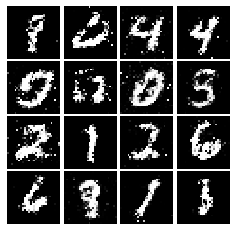

Epoch: 9, Iter: 4340, D: 0.2304, G:0.1684


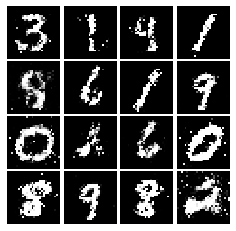

Epoch: 9, Iter: 4360, D: 0.2614, G:0.1516


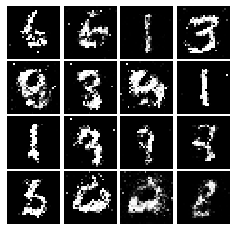

Epoch: 9, Iter: 4380, D: 0.2476, G:0.1683


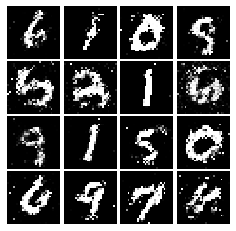

Epoch: 9, Iter: 4400, D: 0.2066, G:0.2143


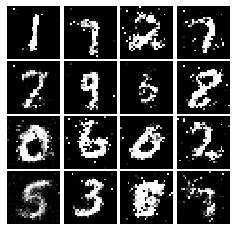

Epoch: 9, Iter: 4420, D: 0.2152, G:0.1701


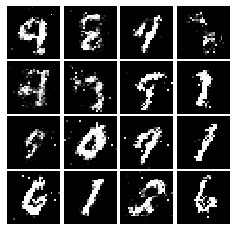

Epoch: 9, Iter: 4440, D: 0.2208, G:0.1888


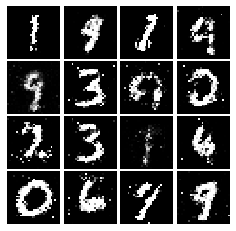

Epoch: 9, Iter: 4460, D: 0.2143, G:0.1844


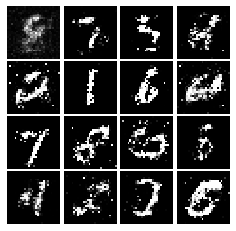

Epoch: 9, Iter: 4480, D: 0.2444, G:0.1655


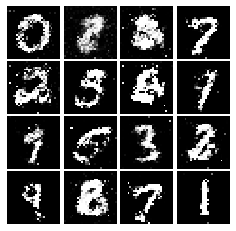

Epoch: 9, Iter: 4500, D: 0.2412, G:0.1735


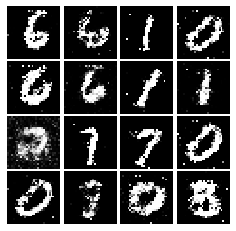

Epoch: 9, Iter: 4520, D: 0.215, G:0.1542


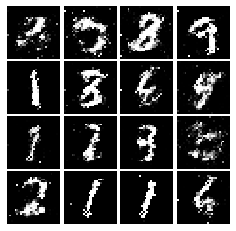

Epoch: 9, Iter: 4540, D: 0.2254, G:0.1274


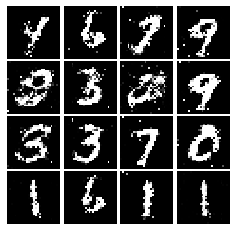

Epoch: 9, Iter: 4560, D: 0.2367, G:0.1467


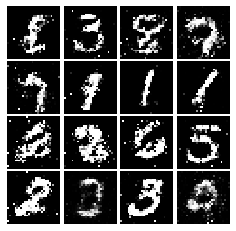

Epoch: 9, Iter: 4580, D: 0.2293, G:0.1771


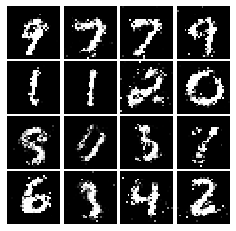

Epoch: 9, Iter: 4600, D: 0.2434, G:0.1619


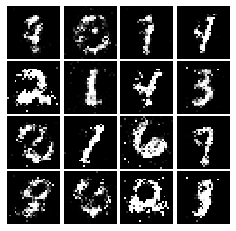

Epoch: 9, Iter: 4620, D: 0.232, G:0.1688


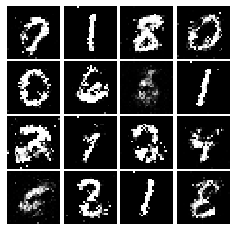

Epoch: 9, Iter: 4640, D: 0.2238, G:0.1493


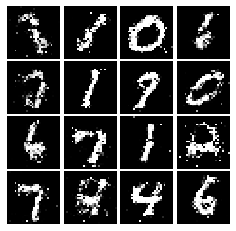

Epoch: 9, Iter: 4660, D: 0.2183, G:0.1683


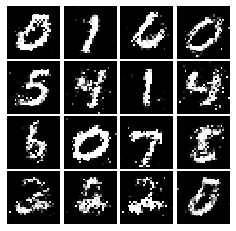

Epoch: 9, Iter: 4680, D: 0.2241, G:0.163


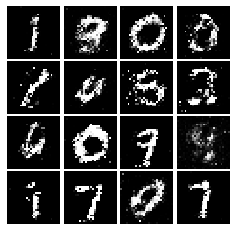

Final images


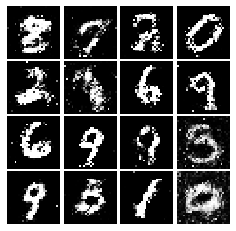

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [24]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Reshape((28,28,1,), input_shape=(784,)),
        tf.keras.layers.Conv2D(filters=32, kernel_size=(5,5), padding='valid', activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=(2,2)),
        tf.keras.layers.Conv2D(filters=64, kernel_size=(5,5), padding='valid', activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=(2,2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64, activation=leaky_relu),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [26]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim, ), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7 * 7 * 128, input_shape=(noise_dim, ), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7, 7, 128)),
        tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=(4,4), strides=(2,2), padding='same', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(filters=1, kernel_size=(4,4), padding='same', strides=(2,2), activation='tanh')
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.29, G:0.6546


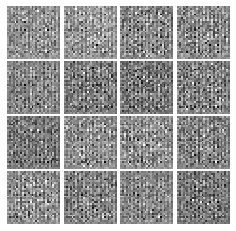

Epoch: 0, Iter: 20, D: 0.5544, G:1.706


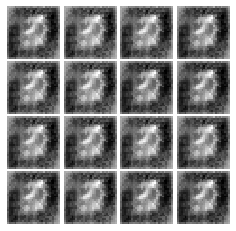

Epoch: 0, Iter: 40, D: 0.259, G:2.957


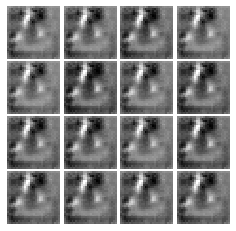

Epoch: 0, Iter: 60, D: 0.09456, G:3.077


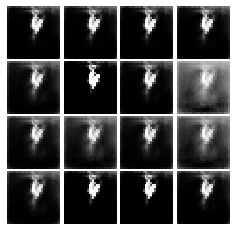

Epoch: 0, Iter: 80, D: 0.7169, G:2.879


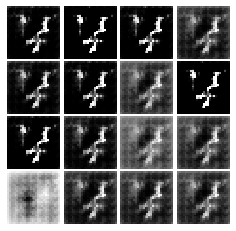

Epoch: 0, Iter: 100, D: 0.9305, G:1.451


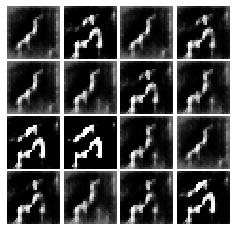

Epoch: 0, Iter: 120, D: 0.2572, G:2.634


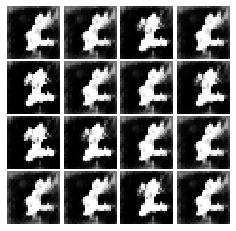

Epoch: 0, Iter: 140, D: 1.418, G:6.222


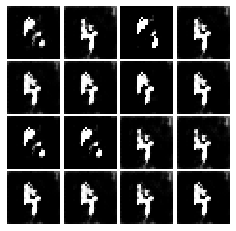

Epoch: 0, Iter: 160, D: 0.4561, G:3.498


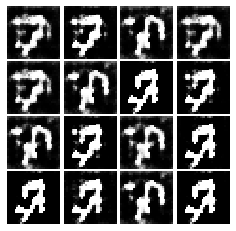

Epoch: 0, Iter: 180, D: 0.05969, G:4.137


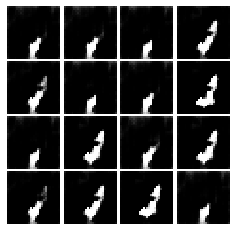

Epoch: 0, Iter: 200, D: 0.3269, G:3.304


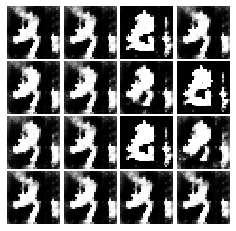

Epoch: 0, Iter: 220, D: 0.8669, G:11.25


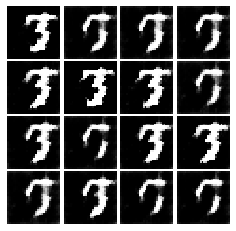

Epoch: 0, Iter: 240, D: 0.4431, G:2.461


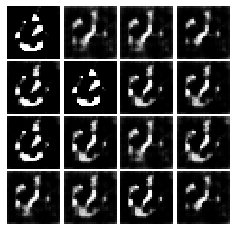

Epoch: 0, Iter: 260, D: 0.7161, G:3.02


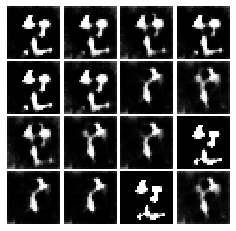

Epoch: 0, Iter: 280, D: 0.4564, G:2.518


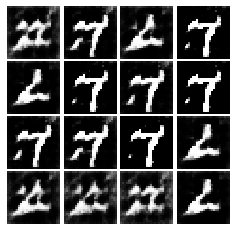

Epoch: 0, Iter: 300, D: 0.765, G:2.415


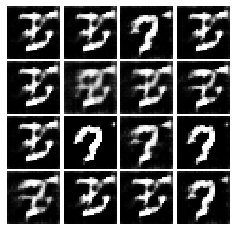

Epoch: 0, Iter: 320, D: 0.4779, G:5.088


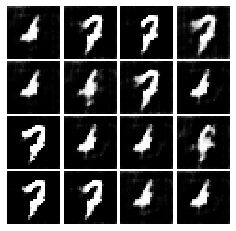

Epoch: 0, Iter: 340, D: 0.5459, G:2.605


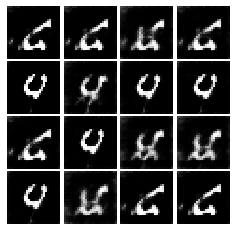

Epoch: 0, Iter: 360, D: 2.276, G:8.241


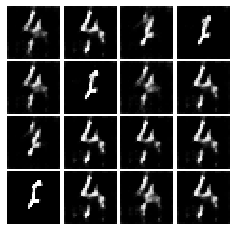

Epoch: 0, Iter: 380, D: 0.3838, G:2.913


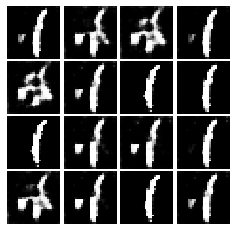

Epoch: 0, Iter: 400, D: 0.8516, G:4.137


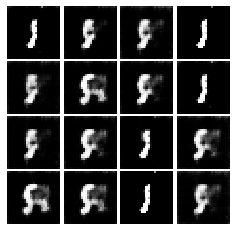

Epoch: 0, Iter: 420, D: 0.5228, G:2.539


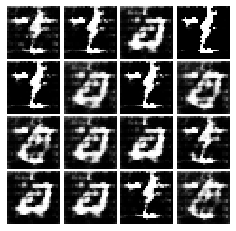

Epoch: 0, Iter: 440, D: 1.158, G:3.342


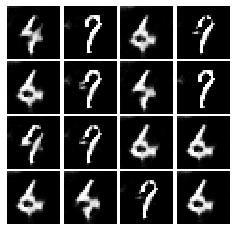

Epoch: 0, Iter: 460, D: 0.187, G:2.98


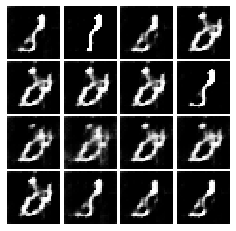

Epoch: 1, Iter: 480, D: 0.8662, G:3.756


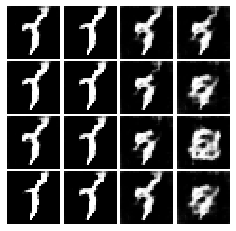

Epoch: 1, Iter: 500, D: 0.2417, G:5.5


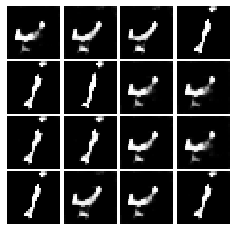

Epoch: 1, Iter: 520, D: 0.3349, G:2.774


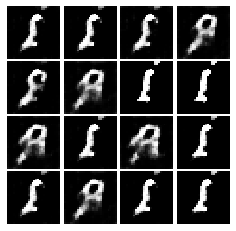

Epoch: 1, Iter: 540, D: 0.5091, G:2.486


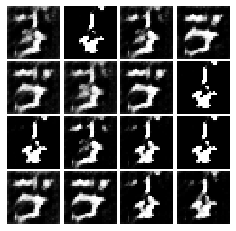

Epoch: 1, Iter: 560, D: 0.3436, G:3.598


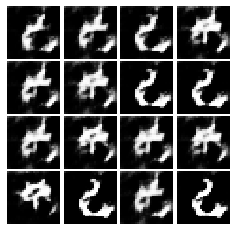

Epoch: 1, Iter: 580, D: 0.4433, G:2.836


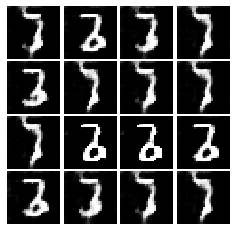

Epoch: 1, Iter: 600, D: 0.1528, G:4.653


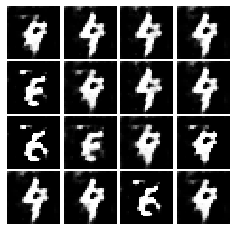

Epoch: 1, Iter: 620, D: 0.6306, G:7.622


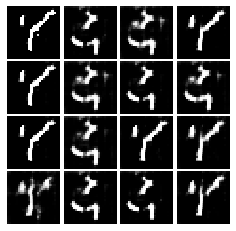

Epoch: 1, Iter: 640, D: 1.216, G:8.631


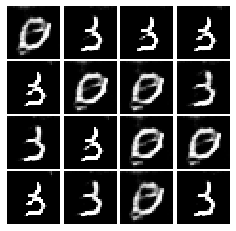

Epoch: 1, Iter: 660, D: 0.3123, G:3.137


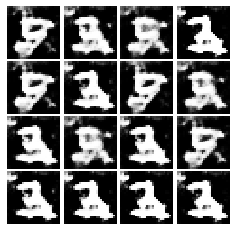

Epoch: 1, Iter: 680, D: 0.2031, G:4.332


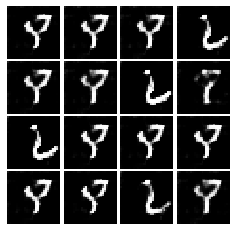

Epoch: 1, Iter: 700, D: 0.3125, G:2.793


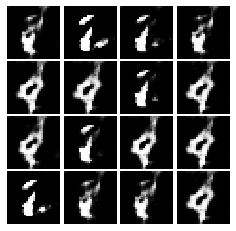

Epoch: 1, Iter: 720, D: 1.531, G:3.728


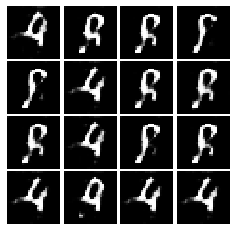

Epoch: 1, Iter: 740, D: 0.5134, G:2.689


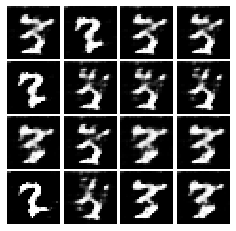

Epoch: 1, Iter: 760, D: 0.3902, G:3.177


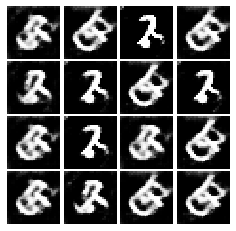

Epoch: 1, Iter: 780, D: 0.2804, G:2.695


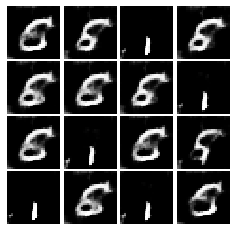

Epoch: 1, Iter: 800, D: 0.4145, G:3.274


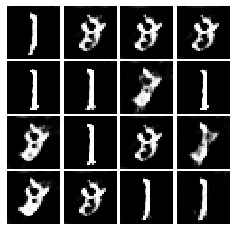

Epoch: 1, Iter: 820, D: 0.4192, G:2.919


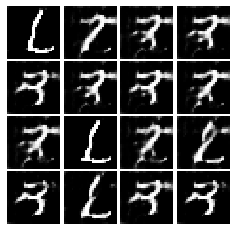

Epoch: 1, Iter: 840, D: 0.3475, G:2.299


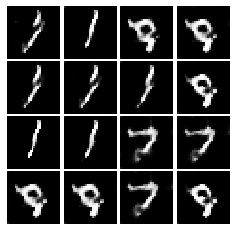

Epoch: 1, Iter: 860, D: 0.2842, G:3.619


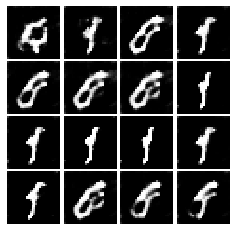

Epoch: 1, Iter: 880, D: 0.4014, G:2.785


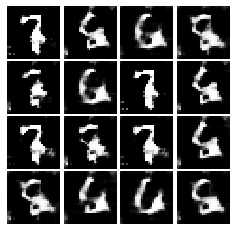

Epoch: 1, Iter: 900, D: 0.3442, G:3.559


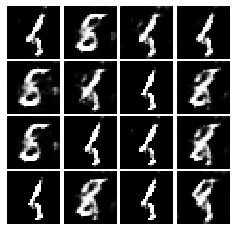

Epoch: 1, Iter: 920, D: 0.08679, G:5.334


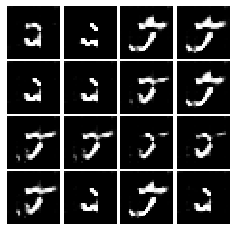

Epoch: 2, Iter: 940, D: 0.2409, G:4.268


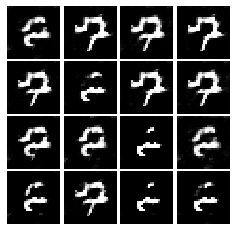

Epoch: 2, Iter: 960, D: 0.8281, G:4.01


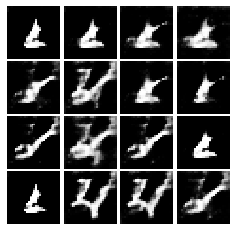

Epoch: 2, Iter: 980, D: 0.4734, G:2.824


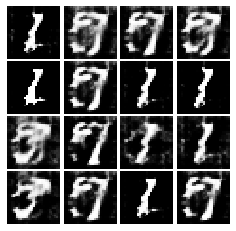

Epoch: 2, Iter: 1000, D: 0.8743, G:5.046


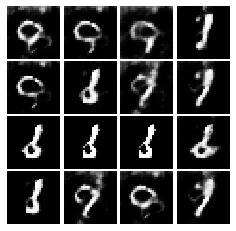

Epoch: 2, Iter: 1020, D: 0.4601, G:2.705


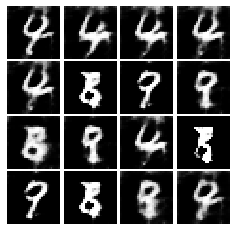

Epoch: 2, Iter: 1040, D: 0.6063, G:4.571


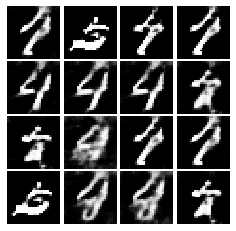

Epoch: 2, Iter: 1060, D: 0.4092, G:2.759


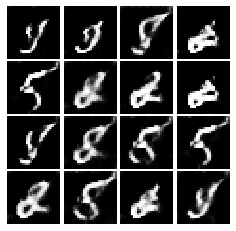

Epoch: 2, Iter: 1080, D: 0.632, G:3.441


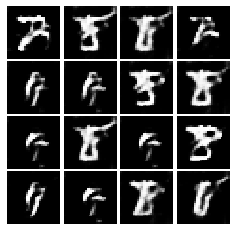

Epoch: 2, Iter: 1100, D: 1.313, G:5.684


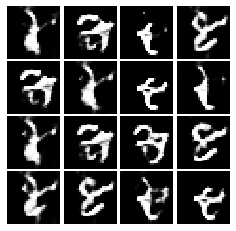

Epoch: 2, Iter: 1120, D: 0.5755, G:1.906


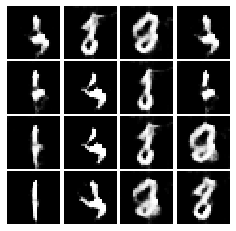

Epoch: 2, Iter: 1140, D: 0.3798, G:3.1


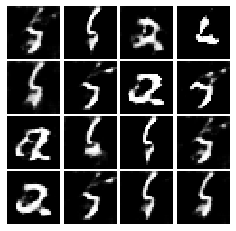

Epoch: 2, Iter: 1160, D: 0.16, G:4.782


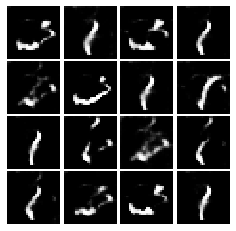

Epoch: 2, Iter: 1180, D: 0.2296, G:3.94


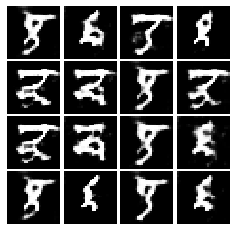

Epoch: 2, Iter: 1200, D: 0.2145, G:3.231


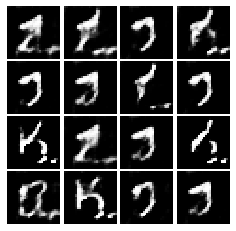

Epoch: 2, Iter: 1220, D: 0.3857, G:2.597


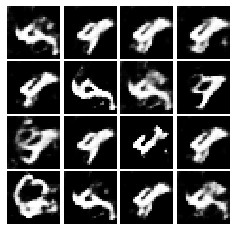

Epoch: 2, Iter: 1240, D: 0.4866, G:2.872


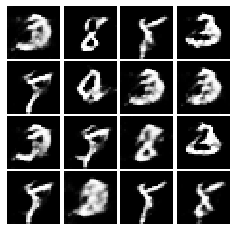

Epoch: 2, Iter: 1260, D: 0.4245, G:4.245


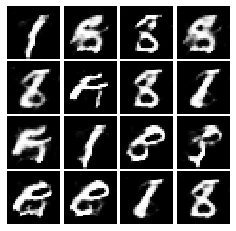

Epoch: 2, Iter: 1280, D: 0.4713, G:3.879


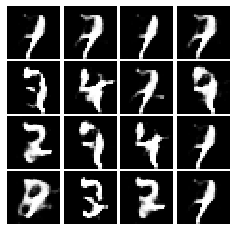

Epoch: 2, Iter: 1300, D: 0.3699, G:2.959


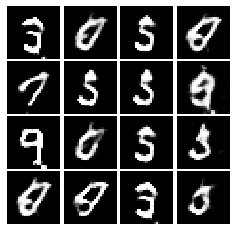

Epoch: 2, Iter: 1320, D: 0.6269, G:3.385


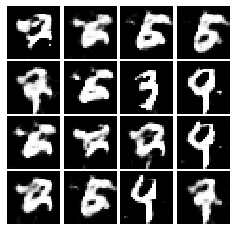

Epoch: 2, Iter: 1340, D: 0.2237, G:4.082


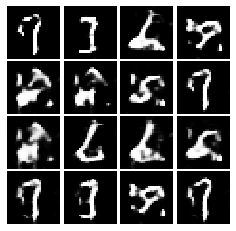

Epoch: 2, Iter: 1360, D: 0.4603, G:4.87


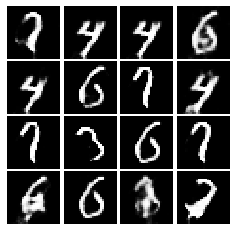

Epoch: 2, Iter: 1380, D: 0.381, G:2.75


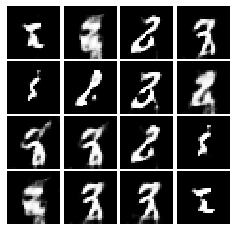

Epoch: 2, Iter: 1400, D: 0.4838, G:4.388


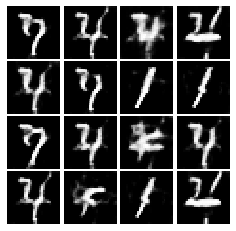

Epoch: 3, Iter: 1420, D: 0.4209, G:4.119


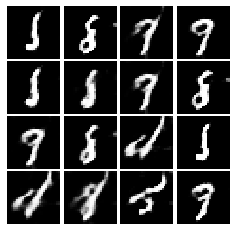

Epoch: 3, Iter: 1440, D: 0.2425, G:3.061


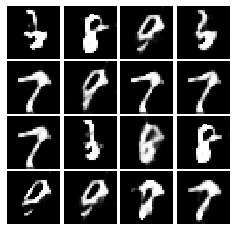

Epoch: 3, Iter: 1460, D: 0.711, G:1.762


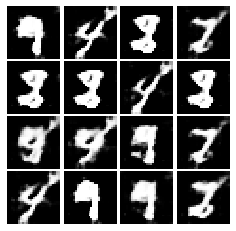

Epoch: 3, Iter: 1480, D: 0.4441, G:2.895


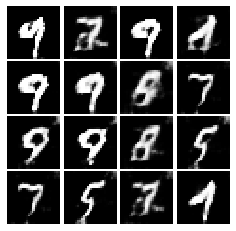

Epoch: 3, Iter: 1500, D: 0.6382, G:2.539


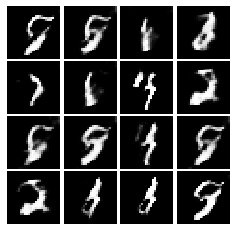

Epoch: 3, Iter: 1520, D: 0.3052, G:2.962


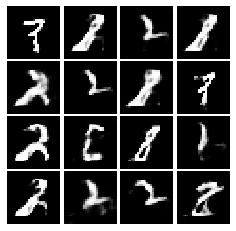

Epoch: 3, Iter: 1540, D: 0.4472, G:3.893


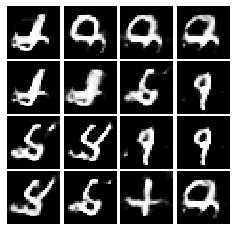

Epoch: 3, Iter: 1560, D: 0.4807, G:3.34


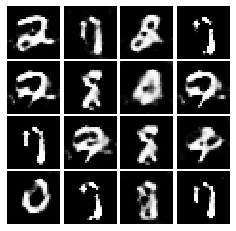

Epoch: 3, Iter: 1580, D: 0.4519, G:1.494


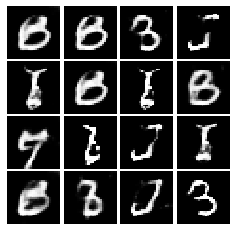

Epoch: 3, Iter: 1600, D: 0.5518, G:2.547


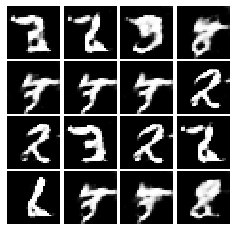

Epoch: 3, Iter: 1620, D: 0.2433, G:4.184


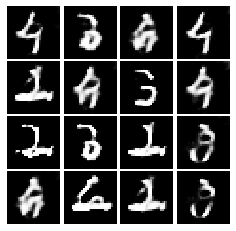

Epoch: 3, Iter: 1640, D: 0.6241, G:3.465


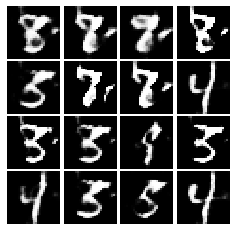

Epoch: 3, Iter: 1660, D: 0.7725, G:4.176


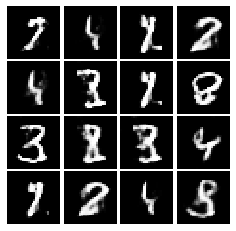

Epoch: 3, Iter: 1680, D: 0.2337, G:3.018


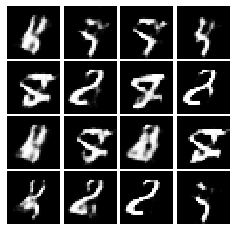

Epoch: 3, Iter: 1700, D: 0.3051, G:4.127


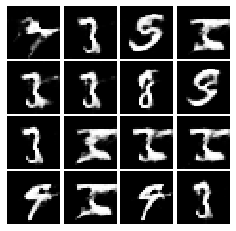

Epoch: 3, Iter: 1720, D: 0.4167, G:2.794


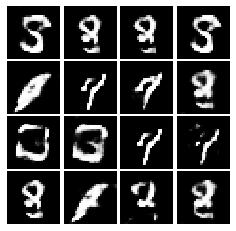

Epoch: 3, Iter: 1740, D: 0.2851, G:2.905


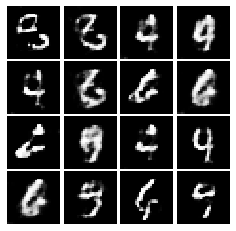

Epoch: 3, Iter: 1760, D: 0.1603, G:4.297


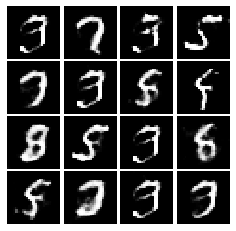

Epoch: 3, Iter: 1780, D: 0.3341, G:3.515


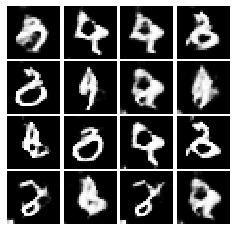

Epoch: 3, Iter: 1800, D: 0.9854, G:6.932


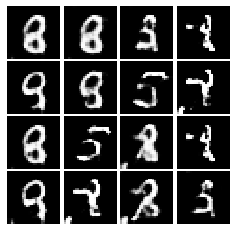

Epoch: 3, Iter: 1820, D: 0.6177, G:1.777


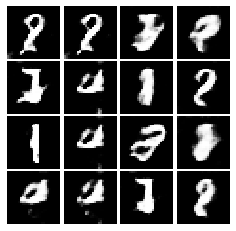

Epoch: 3, Iter: 1840, D: 0.7311, G:2.639


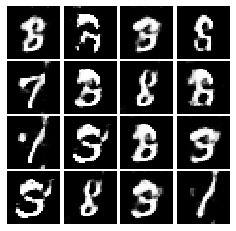

Epoch: 3, Iter: 1860, D: 0.468, G:3.347


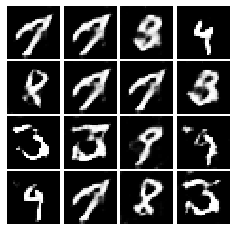

Epoch: 4, Iter: 1880, D: 0.3816, G:2.924


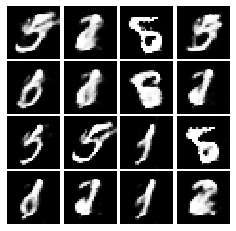

Epoch: 4, Iter: 1900, D: 0.3384, G:3.396


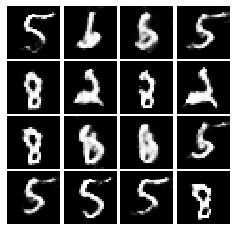

Epoch: 4, Iter: 1920, D: 0.8802, G:2.381


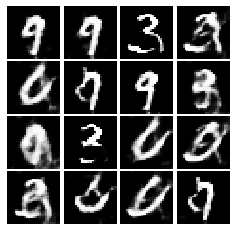

Epoch: 4, Iter: 1940, D: 0.5271, G:2.558


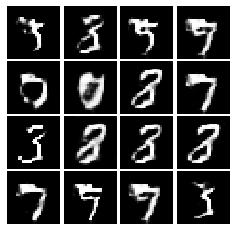

Epoch: 4, Iter: 1960, D: 0.4197, G:2.263


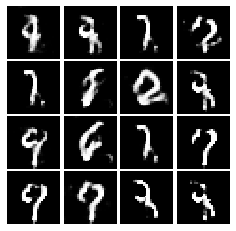

Epoch: 4, Iter: 1980, D: 0.3621, G:2.961


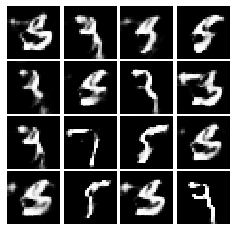

Epoch: 4, Iter: 2000, D: 0.316, G:3.529


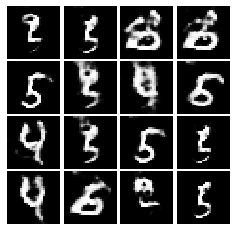

Epoch: 4, Iter: 2020, D: 0.4364, G:3.582


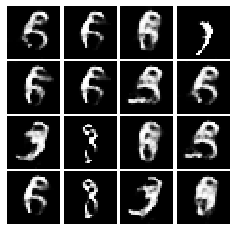

Epoch: 4, Iter: 2040, D: 0.1853, G:3.818


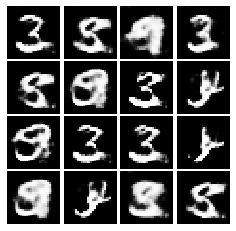

Epoch: 4, Iter: 2060, D: 0.1821, G:3.273


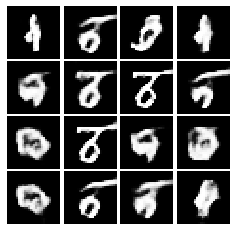

Epoch: 4, Iter: 2080, D: 0.2286, G:3.09


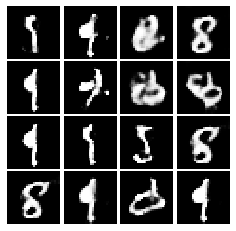

Epoch: 4, Iter: 2100, D: 0.3028, G:3.611


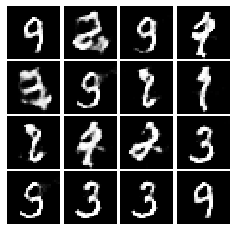

Epoch: 4, Iter: 2120, D: 0.4088, G:3.511


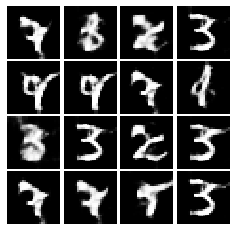

Epoch: 4, Iter: 2140, D: 0.7746, G:5.021


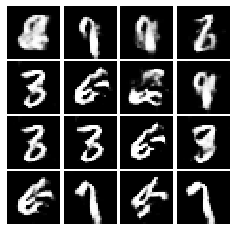

Epoch: 4, Iter: 2160, D: 0.3022, G:3.534


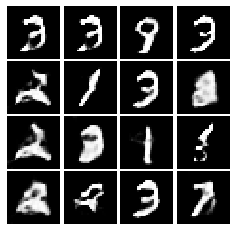

Epoch: 4, Iter: 2180, D: 0.4593, G:3.004


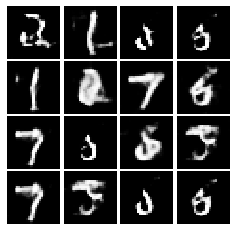

Epoch: 4, Iter: 2200, D: 0.5049, G:2.527


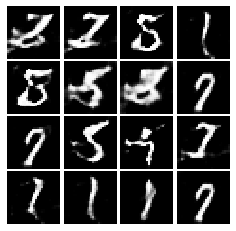

Epoch: 4, Iter: 2220, D: 0.1186, G:4.348


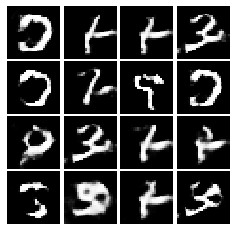

Epoch: 4, Iter: 2240, D: 0.3584, G:3.031


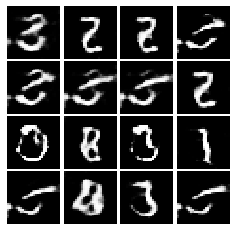

Epoch: 4, Iter: 2260, D: 0.2141, G:2.865


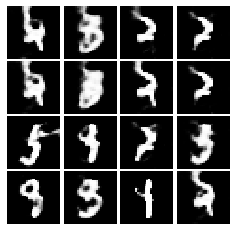

Epoch: 4, Iter: 2280, D: 0.1893, G:4.248


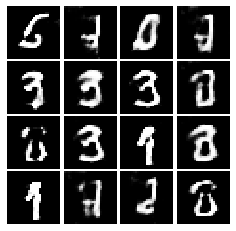

Epoch: 4, Iter: 2300, D: 0.4084, G:3.02


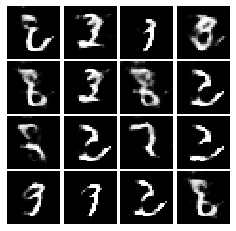

Epoch: 4, Iter: 2320, D: 0.3284, G:4.122


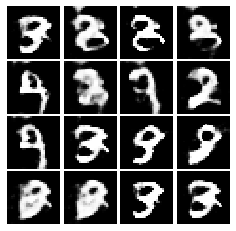

Epoch: 4, Iter: 2340, D: 0.9194, G:5.668


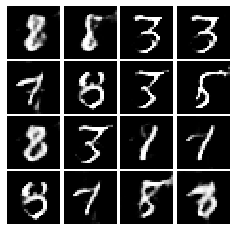

Final images


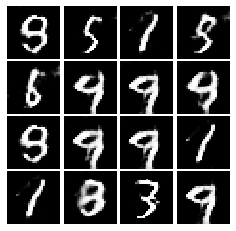

In [27]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2    |   2    |   0    |   -2    |   -4    |  -4     
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |   0    |   -2    |   -2    |   -2    |   0    |   4    
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 

Since the generator and the discriminator will alternate between negative and positive values, this objective will either evaluate to $- \infty$, 0 or $ \infty$


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 

If generator loss decreases fast then it probably means that it learned to outsmart the discriminator before the discriminator could learn the task, let alone determine whether given data is real or fake. Since the GAN requires harmonious learning on both the discriminator and the generator, this GAN will most likely not converge. 

*Many thanks to Stanford CS231n for permission to use their materials!*